# **HUL715 Paper Replication** 
## Forecasting the Yield Spread Using PCA, Vasicek and ARIMA Models 



**Abstract of the paper**

In this research paper, the author has applied various econometric time series and two machine learning models (MLPs, LSTMs) to forecast the
daily data on the yield spread i.e. the difference between the 10-year Treasury yields and the 3-month Treasury bills. 

First, we decomposed the yield curve into its principal components, then simulated various paths of the yield spread using the
Vasicek model. After constructing univariate ARIMA models, and multivariate models such as ARIMAX, VAR and
Long Short Term Memory (LSTM), I calibrated the root mean squared error (RMSE) to measure how far the models’
results deviate from the current values. Through impulse response functions, we measure the impact of various shocks on
the difference yield spread. 

The results indicate that the parsimonious univariate ARIMA model (RMSE = 0.05185)
outperforms the richly parameterized VAR method (RMSE = 0.4648) , and the complex LSTM with multivariate data
performs equally well as the simple ARIMA model.

# Gathering data and environment setup

In [1]:
!pip install arch
!pip install fredapi
!pip install quandl

In [2]:
import warnings
warnings.filterwarnings('ignore')

import math
from math import sqrt
import datetime
from datetime import date, timedelta
import numpy as np
import pandas as pd
from pandas import Series
from pandas import DataFrame
import scipy
import scipy.stats as scs
import statsmodels.api as sm

from fbprophet import Prophet # for forecasting via ML called "Prophet"
from fbprophet.plot import plot_plotly
import logging
logging.getLogger().setLevel(logging.ERROR) # mutes unimportant diagnostic messages



import sklearn.decomposition as sck_dec # has PCA functionalities
import sklearn.decomposition.pca as PCA
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler # for standardizing the Data
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.arima_model import ARIMA
from arch import arch_model # has ARCH and GARCH models

import seaborn as sn

import matplotlib
from matplotlib import pyplot
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
# matplotlib.style.use('dark_background')
matplotlib.style.use('default')
%matplotlib inline
import matplotlib.pyplot as plt


# standardizes the size of all plots, rather than typing plot(figsize = (12,6)) everytime
from pylab import rcParams
rcParams['figure.figsize'] = 12,6 

import seaborn as sns
from plotly import __version__ 
import cufflinks as cf 
from IPython.display import display, HTML, Image
import plotly
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objects as go
import plotly.figure_factory as ff
import plotly.express as px

# set plotly to offline mode for easy reproducibilty
import plotly.offline as py
py.init_notebook_mode()

from statsmodels.tsa.stattools import adfuller,grangercausalitytests
from statsmodels.tsa.stattools import ccovf,ccf,periodogram
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf


# Deep learning packages
import keras
from keras.models import Sequential
from keras.layers import LSTM, Dense
from keras.layers import Dropout
from keras.layers import *
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from keras.callbacks import EarlyStopping

In [3]:
from fredapi import Fred
import quandl

quandl.ApiConfig.api_key = '-kesKc4A8jkkBwyX3rSX'
fred = Fred(api_key='08ac10f3d6d00a973c9cdec45990f255')  

In [4]:
today_date = "2020-12-15"
paper_end_date = "2020-08-21"

#edit end_date to control the end_date of the API call
end_date = today_date

In [5]:
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')

treas = ['FRED/DGS3MO',
           'FRED/DGS6MO',
           'FRED/DGS1',
           'FRED/DGS2',
           'FRED/DGS3',
           'FRED/DGS5',
           'FRED/DGS7',
           'FRED/DGS10',
           'FRED/DGS20',
           'FRED/DGS30',
           'FRED/T10Y3M'] # 10-Year Treasury Constant Maturity Minus 3-Month Treasury Constant Maturity

data = quandl.get(treas, start_date = "1993-10-01", end_date=end_date,
                  order='asc', collapse = 'daily', date_parser=parser)
data.columns = ['tres3mo', 
                    'tres6mo',
                    'tres1y',
                    'tres2y',
                    'tres3y',
                    'tres5y',
                    'tres7y',
                    'tres10y',
                    'tres20y',
                    'tres30y',
                    'yieldsp']


In [6]:
print(data.shape)
data

(6806, 11)


,tres3mo,tres6mo,tres1y,tres2y,tres3y,tres5y,tres7y,tres10y,tres20y,tres30y,yieldsp
Date,,,,,,,,,,,
1993-10-01,2.98,3.11,3.35,3.84,4.18,4.72,5.03,5.34,6.12,5.98,2.36
1993-10-04,3.02,3.17,3.35,3.85,4.16,4.71,5.04,5.34,6.10,5.99,2.32
1993-10-05,3.06,3.20,3.38,3.86,4.18,4.72,5.05,5.35,6.12,6.01,2.29
1993-10-06,3.04,3.19,3.36,3.85,4.16,4.70,5.05,5.35,6.12,6.01,2.31
1993-10-07,3.05,3.17,3.35,3.83,4.15,4.69,5.05,5.33,6.11,6.01,2.28
...,...,...,...,...,...,...,...,...,...,...,...
2020-12-09,0.08,0.09,0.10,0.16,0.21,0.41,0.68,0.95,1.48,1.69,0.87
2020-12-10,0.08,0.09,0.10,0.14,0.20,0.39,0.65,0.92,1.44,1.65,0.84
2020-12-11,0.08,0.08,0.10,0.11,0.18,0.37,0.63,0.90,1.42,1.63,0.82


In [7]:
data.describe()

,tres3mo,tres6mo,tres1y,tres2y,tres3y,tres5y,tres7y,tres10y,tres20y,tres30y,yieldsp
count,6806.000000,6806.000000,6806.000000,6806.000000,6806.000000,6806.000000,6806.000000,6806.000000,6806.000000,6806.000000,6806.000000
mean,2.375043,2.503572,2.623221,2.877467,3.073964,3.439993,3.741892,3.979077,4.493748,4.545438,1.604020
std,2.138845,2.181814,2.184475,2.176942,2.107344,1.955291,1.848460,1.722358,1.684365,1.526726,1.119141
min,0.000000,0.020000,0.080000,0.110000,0.100000,0.190000,0.360000,0.520000,0.870000,0.990000,-0.950000
25%,0.160000,0.240000,0.410000,0.790000,1.110000,1.690000,2.130000,2.470000,2.890000,3.100000,0.660000
50%,1.740000,1.900000,2.100000,2.440000,2.600000,3.090000,3.550000,3.990000,4.640000,4.640000,1.570000
75%,4.780000,4.980000,4.960000,4.910000,4.910000,5.020000,5.220000,5.270000,5.820000,5.670000,2.550000
max,6.420000,6.670000,7.320000,7.740000,7.840000,7.900000,7.920000,8.050000,8.300000,8.160000,3.850000


In [8]:
# check if data contains nan
np.isnan(data).any() 

tres3mo    False
tres6mo    False
tres1y     False
tres2y     False
tres3y     False
tres5y     False
tres7y     False
tres10y    False
tres20y    False
tres30y    False
yieldsp    False
dtype: bool

In [9]:
#fill nan values using the fill forward heuristic in case there are any nan values

data_df = data.interpolate(method='spline', order=3).replace([np.inf, -np.inf], 0)
#data_df = data.fillna(method='ffill').replace([np.inf, -np.inf], 0)
np.isnan(data_df).any() 

tres3mo    False
tres6mo    False
tres1y     False
tres2y     False
tres3y     False
tres5y     False
tres7y     False
tres10y    False
tres20y    False
tres30y    False
yieldsp    False
dtype: bool

In [10]:
#data1 is just the data DataFrame without the yeildspread variable
data1 = data_df.loc[:, data.columns != 'yieldsp']
data1.shape

(6806, 10)

10Y minus 3M treasury i.e. **Yield Spread**

In [11]:
# 10-Year Treasury Constant Maturity Minus 3-Month Treasury Constant Maturity
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')

yieldsp = quandl.get('FRED/T10Y3M', start_date = "1982-01-04", end_date= end_date,collapse = 'daily',
                  date_parser=parser)
yieldsp.columns = ['yieldsp']
yieldsp.tail()

,yieldsp
Date,
2020-12-09,0.87
2020-12-10,0.84
2020-12-11,0.82
2020-12-14,0.81
2020-12-15,0.84


In [12]:
yieldsp.shape

(9741, 1)

In [13]:
yieldsp.describe()

,yieldsp
count,9741.000000
mean,1.744351
std,1.122410
min,-0.960000
25%,0.830000
50%,1.800000
75%,2.650000
max,5.180000


# Data visualisation

### Plotting treasury yield rates for different maturities

In [14]:
#plotly has some compatibility issues with colab, just taking care of those
import plotly.io as pio
pio.renderers.default = 'colab'

In [15]:
tresury_rates_plot = data1.iplot(asFigure=True, kind='scatter', xTitle='Year', yTitle='Treasury Rates')

tresury_rates_plot.update_layout( title={ 'text': "Treasury Yields of Different Maturities",
                                         'y':0.9, 'x':0.5, 'xanchor': 'center', 'yanchor': 'top'})
tresury_rates_plot.layout.template = 'seaborn'
tresury_rates_plot.show()

### Plot an interactive 3D yield curve for varying maturities

In [16]:
ids = ['3-month', '6-month', '1-year','2-year', '5-year', '7-year', '10-year', '20-year', '30-year']

plotly.offline.iplot({
    "data": [
        go.Surface(
            x=ids,
            y=data1.index,
            z=data1.values,
            # colorscale='Greens',

            # reverse scale and remove colorbar
            reversescale=True,
            showscale=True,

            # show contours on x axis only
            contours={
                'x': {
                    'highlight': True,
                    'highlightcolor': 'white',
                    'highlightwidth': 2
                },
                'y': {
                    'highlight': True,
                    'highlightcolor': 'white',
                    'highlightwidth': 3
                },
                'z': {
                    'highlight': False
                }
            })
    ],

    "layout":
    go.Layout(
        title='Interactive 3D Yield Curve',
        width=1200,
        height=800,

        # change aspect ratio and axis titles
        scene={
            'aspectmode': 'manual',
            'aspectratio': {
                'x': 5,
                'y': 15,
                'z': 3
            },
            'yaxis': {
                'title': ''
            },
            'xaxis': {
                'title': 'Maturity duration',
                'tickmode': 'linear',
                'tickfont': {'size': 10}
            },
            'zaxis': {
                'title': 'Treasury Yield (in percent)',
                'tickmode': 'linear',
                'tickfont': {'size': 10},
                'showticklabels': True,
                'showgrid': True
            }
        },
        hoverlabel={'bgcolor': 'turquoise'})
})

### Plot the yield spread from Jan, 2005

In [17]:
# Using graph_objects

yield_df = go.Scatter(x = yieldsp.index, y = yieldsp['yieldsp'], line=dict(color='green', width= 1))

layout = go.Layout(title='Yield Spread (10 Year minus 3 Month Treasury Rate) between Jan 1, 2005 and Dec 15, 2020', 
                   title_font_size=15, 
                   xaxis_title="", yaxis_title="Yield Spread (in percentages)", 
                   xaxis_range=[datetime.datetime(2005, 1, 1),
                   datetime.datetime(2020, 12, 15)])

fig = go.Figure(data=[yield_df], layout=layout)
iplot(fig)



---

# Methods and Results

# Principal Component Analysis (PCA)



PCA extracts the signal and diminishes the dataset's dimensionality. This is
because it finds the fewest number of variables that explain the largest proportion of the data.

The author has decomposed the data into 5 principal components and has then calculated the proportion of total variance explained by each of the components. 

In [ ]:
X = data1.values 

# Standard Scaler transforms dataframe into a normal distribution
sc = StandardScaler().fit_transform(X)
# replace the nan values in the sc array to 0
sc[np.isnan(sc)] = 0 

In [19]:
# do PCA with n_components left
pca = PCA(n_components = 5)
pcs = pca.fit_transform(sc)

pc_df = pd.DataFrame(data = pcs, columns = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5'])

pc_df['PC2'] = pc_df['PC2']*(-1)   # the negative of PC2 is highly correlated to the yield spread 
pc_yieldsp = pd.merge(pc_df, data[['tres10y', 'yieldsp']], 
                      on = data.index).rename(columns= {'key_0': 'Date'}).set_index('Date')
pc_yieldsp.head()

,PC1,PC2,PC3,PC4,PC5,tres10y,yieldsp
Date,,,,,,,
1993-10-01,1.862628,0.786127,0.021733,0.011433,0.038445,5.34,2.36
1993-10-04,1.873816,0.767228,0.040964,0.004595,0.026150,5.34,2.32
1993-10-05,1.905672,0.762668,0.053980,0.005000,0.025452,5.35,2.29
1993-10-06,1.890554,0.772518,0.056664,0.004707,0.027388,5.35,2.31
1993-10-07,1.876005,0.771827,0.061369,0.000007,0.020266,5.33,2.28


### Plotting the principal components

In [20]:
fig_pc = pc_yieldsp[['PC1', 'PC2', 'PC3']].iplot(asFigure=True, 
                      kind='scatter', xTitle='Year', yTitle='Principal Component')
fig_pc.update_layout(
    title={
        'text': "Three Principal Components (PC) that Constitute the Yield Curve",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig_pc.show()

## Exploring the proportion of the total variance explained by each component

We can calculate the proportion of the total variance explained by each $PC_i$ by the relation:


$$V (PC_i) = \frac{\lambda_i}{\lambda_1+\lambda_2+...+\lambda_5}$$

In [21]:
# returns Percentage of variance explained by each of the selected components

ratio = pca.explained_variance_ratio_               
ratio_df = pd.DataFrame(ratio, columns=['Percentage of variance explained by component'])  
print(ratio_df)

   Percentage of variance explained by component
0                                       0.935798
1                                       0.059747
2                                       0.003486
3                                       0.000454
4                                       0.000241


#### [Scree plot](https://en.wikipedia.org/wiki/Scree_plot#:~:text=In%20multivariate%20statistics%2C%20a%20scree,principal%20component%20analysis%20(PCA).): Plotting the proportion of variance explained by each component

In [22]:
fig_ratio = ratio_df.iplot(asFigure=True, kind='scatter', #layout = layout,
                                            xTitle='Principal Component', yTitle='Eigenvalue (Proportion)')
fig_ratio.update_layout(
    title={
        'text': "Scree Plot: Proportion of Total Variance Explained by each PC",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig_ratio.show()

The plot of the first principal component looks very similar to the actual 10-year yield curve. This is consistent with our expectation as the first principal component explains **93.52%** of the data.

In [23]:
fig_pc1 = pc_yieldsp[['PC1','tres10y']].iplot(asFigure=True, 
                      kind='scatter', xTitle='Year', yTitle='Rates')
fig_pc1.update_layout(
    title={
        'text': "PC1 and 10-year Treasury Yield",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig_pc1.show()

The second principal component depicts the slope, which in this case is the difference between the 10 year treasury bond and the 3 month tresury bill, also called the yield spread. Visually, the slope appears nearly identical to $PC_2$.

In [24]:
fig_pc2 = pc_yieldsp[['PC2','yieldsp']].iplot(asFigure=True, 
                      kind='scatter', xTitle='Year', yTitle='Rates')

fig_pc2.update_layout(
    title={
        'text': "PC2 and Yield Spread (10y-3m Treasury Rate)",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig_pc2.show()

The high correlation of **0.916** between the 10Y-3M spread and $PC_2$ corroborates the evidence that the second principal component denotes the slope. 

### Correlation matrix

In [25]:
#Correlation matrix 

pc_yieldsp[['PC1', 'PC2', 'PC3','tres10y', 'yieldsp']].corr()

,PC1,PC2,PC3,tres10y,yieldsp
PC1,1.000000e+00,1.912883e-16,3.138477e-16,0.974053,-0.311746
PC2,1.912883e-16,1.000000e+00,-4.020391e-16,0.223748,0.927806
PC3,3.138477e-16,-4.020391e-16,1.000000e+00,-0.012598,-0.188014
tres10y,9.740531e-01,2.237479e-01,-1.259788e-02,1.000000,-0.092277
yieldsp,-3.117462e-01,9.278059e-01,-1.880136e-01,-0.092277,1.000000


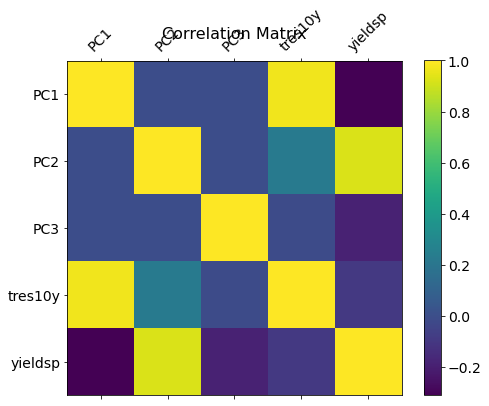

In [26]:
f = plt.figure(figsize=(8, 6))
plt.matshow(pc_yieldsp[['PC1', 'PC2', 'PC3','tres10y', 'yieldsp']].corr(), fignum=f.number)
plt.xticks(range(pc_yieldsp[['PC1', 'PC2', 'PC3','tres10y', 'yieldsp']].shape[1]), pc_yieldsp[['PC1', 'PC2', 'PC3','tres10y', 'yieldsp']].columns, fontsize=14, rotation=45)
plt.yticks(range(pc_yieldsp[['PC1', 'PC2', 'PC3','tres10y', 'yieldsp']].shape[1]), pc_yieldsp[['PC1', 'PC2', 'PC3','tres10y', 'yieldsp']].columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Correlation Matrix', fontsize=16);

# Vasicek Interest Rate Model



*   A stochastic technique of modeling the instantaneous movements in the term structure of forward interest rates is the [Vasicek interest rate model](https://en.wikipedia.org/wiki/Vasicek_model).
*   The factors that describe the trajectory of interest rates are time, market risk, and equilibrium value, wherein the
model assumes that the rates revert to the mean of those factors as time passes.

This method employs maximum likelihood estimation to derive the
parameters of the Vasicek model, which is of the form:


$$ dr_t = k(\theta-r_t) dt + \sigma dW_t $$
where, $k=$ strength of mean reversion or the speed at which the yield spread rates revert to the mean $\theta$;

$\theta$ is the level of mean reversion or the long-run level of yield spread

$\sigma$ is the volatility in yield spread at time t

$r_t $ is the short rate (yield spread) at time t

$k(\theta - r_t)$ are the expected changes in the yield spread or the drift term, also known as the mean reversion for Vasicek model, and 

$W$ is the random market risk that follows a [Wiener process](https://en.wikipedia.org/wiki/Wiener_process).




Using the closed form solution given below that avoids “discretization errors”, we have
simulated the paths of the yield spread:

$$ r_{t_i} = r_{t_{i-1}} e^{-k(t_i-t_{i-1})} + \theta (1- e^{-k(t_i-t_{i-1})}) + Z \sqrt{\frac{\sigma^2 (1- e^{-2k(t_i-t_{i-1})} )}{2k}} $$

where $Z \sim N(0,1)$

In [27]:
# helper functions for Vasicek interest rate model 

def VasicekNextRate(r, kappa, theta, sigma, dt=1/252):
    # Implements above closed form solution     
    val1 = np.exp(-1*kappa*dt)
    val2 = (sigma**2)*(1-val1**2) / (2*kappa)
    out = r*val1 + theta*(1-val1) + (np.sqrt(val2))*np.random.normal()
    return out



def VasicekSim(N, r0, kappa, theta, sigma, dt = 1/252):
    short_r = [0]*N # Create array to store rates     short_r[0] = r0 # Initialise rates at $r_0$     
    
    for i in range(1,N):
        short_r[i] = VasicekNextRate(short_r[i-1], kappa, theta, sigma, dt)
    
    return short_r




def VasicekMultiSim(M, N, r0, kappa, theta, sigma, dt = 1/252):
    sim_arr = np.ndarray((N, M))
    
    for i in range(0,M):
        sim_arr[:, i] = VasicekSim(N, r0, kappa, theta, sigma, dt)
    
    return sim_arr



def VasicekCalibration(rates, dt=1/252):
    n = len(rates)
    
    # Implement MLE to calibrate parameters 
    Sx = sum(rates[0:(n-1)])
    Sy = sum(rates[1:n])
    Sxx = np.dot(rates[0:(n-1)], rates[0:(n-1)])
    Sxy = np.dot(rates[0:(n-1)], rates[1:n])
    Syy = np.dot(rates[1:n], rates[1:n])
    
    theta = (Sy * Sxx - Sx * Sxy) / (n * (Sxx - Sxy) - (Sx**2 - Sx*Sy))
    kappa = -np.log((Sxy - theta * Sx - theta * Sy + n * theta**2) / (Sxx - 2*theta*Sx + n*theta**2)) / dt
    a = np.exp(-kappa * dt)
    sigmah2 = (Syy - 2*a*Sxy + a**2 * Sxx - 2*theta*(1-a)*(Sy - a*Sx) + n*theta**2 * (1-a)**2) / n
    sigma = np.sqrt(sigmah2*2*kappa / (1-a**2))
    r0 = rates[n-1]
    
    return [kappa, theta, sigma, r0]

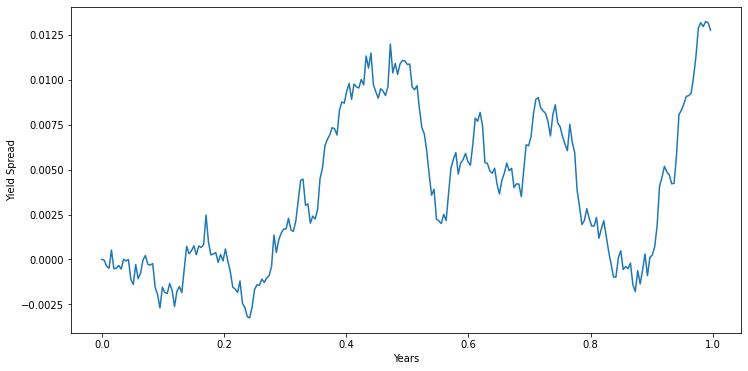

In [28]:
params = VasicekCalibration(yieldsp.loc[:, 'yieldsp'].dropna()/100)

kappa = params[0]
theta = params[1]
sigma = params[2]
r0 = params[3]

years = 1
N = years * 252
t = np.arange(0,N)/252

test_sim = VasicekSim(N, r0, kappa, theta, sigma, 1/252)
plt.plot(t,test_sim)
plt.ylabel("Yield Spread")
plt.xlabel("Years")
plt.show()

Simulating from $r_0$ = last observed value and assuming $\theta = 1.75 \% $, we have generated a sequence of 10 ex-ante trajectories of the yield spread.

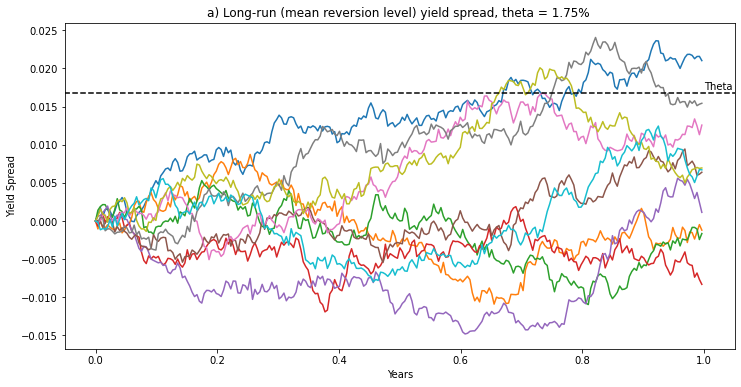

In [29]:
M = 10
rates_arr = VasicekMultiSim(M, N, r0, kappa, theta, sigma)

plt.plot(t,rates_arr)
plt.hlines(y=theta, xmin = -100, xmax=100, zorder=10, linestyles = 'dashed', label='Theta')
plt.annotate('Theta', xy=(1.0, theta + 0.0005))
plt.xlim(-0.05, 1.05)
plt.ylabel("Yield Spread")
plt.xlabel("Years")
plt.title("Long-run (mean reversion level) yield spread, theta = 1.75% ")
plt.show()


### Effect of $r_0$

We observe the model's mean reverting nature by specifying $r_0$ further away from $\theta$. Over time this pulls the yield spread towards $\theta$.


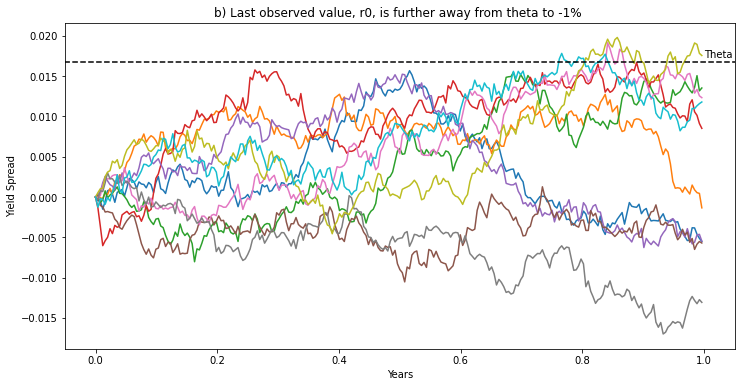

In [30]:
M = 10
rates_arr = VasicekMultiSim(M, N, -0.01, kappa, theta, sigma)
plt.plot(t,rates_arr)
plt.hlines(y=theta, xmin = -100, xmax=100, zorder=10, linestyles = 'dashed', label='Theta')
plt.annotate('Theta', xy=(1.0, theta+0.0005))
plt.xlim(-0.05, 1.05)
plt.ylabel("Yield Spread")
plt.xlabel("Years")
plt.title("Last observed value, r0, is further away from theta to -1% ")
plt.show()

### Effect of $\kappa$

The magnitude of $\kappa$ controls the speed of the reversion.  As $\kappa$ grows, mean reversion quickens. 

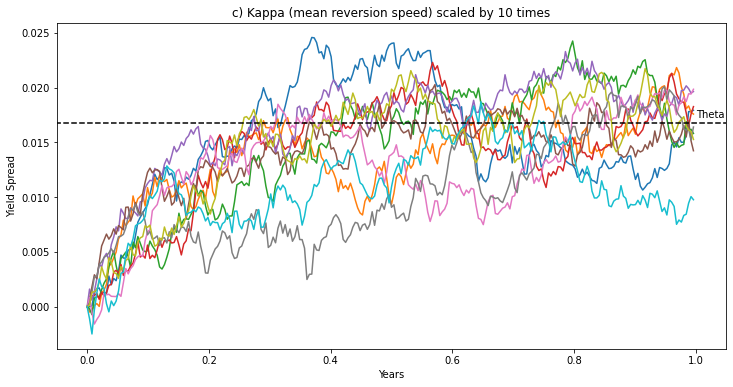

In [31]:
M = 10
rates_arr = VasicekMultiSim(M, N, -0.01, kappa*10, theta, sigma)
plt.plot(t,rates_arr)
plt.hlines(y=theta, xmin = -100, xmax=100, zorder=10, linestyles = 'dashed', label='Theta')
plt.annotate('Theta', xy=(1.0, theta+0.0005))
plt.xlim(-0.05, 1.05)
plt.ylabel("Yield Spread")
plt.xlabel("Years")
plt.title("Kappa (mean reversion speed) scaled by 10 times")
plt.show()


### Effect of $\sigma$

Likewise, larger $\sigma$ widens the volality and the potential distribution rate. 

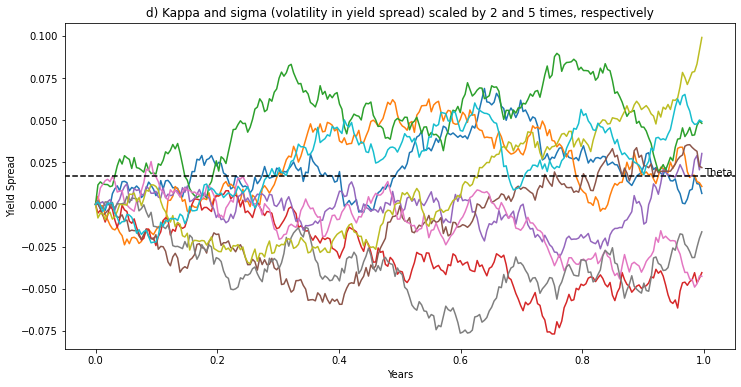

In [32]:
M = 10
rates_arr = VasicekMultiSim(M, N, -0.01, kappa*2, theta, sigma*5)
plt.plot(t,rates_arr)
plt.hlines(y=theta, xmin = -100, xmax=100, zorder=10, linestyles = 'dashed', label='Theta')
plt.annotate('Theta', xy=(1.0, theta+0.0005))
plt.xlim(-0.05, 1.05)
plt.ylabel("Yield Spread")
plt.xlabel("Years")
plt.title("Kappa and sigma (volatility in yield spread) scaled by 2 and 5 times, respectively")
plt.show()


# Stationarity

We first check for stationarity of the yield spread using the Augmented Dickey Fuller Test.

In [33]:
import statsmodels.tsa.api as smt

'''
Test stationarity by:
    - running Augmented Dickey-Fuller test with 95%
    - plotting mean and variance of a sample from data
    - plotting autocorrelation and partial autocorrelation
'''

def test_stationarity_acf_pacf(ts, sample=0.20, maxlag=30, figsize= (18,12)):
    
    # configuring all the plot in one image itself 
    plt.style.context(style='default')
    stationarity_fig = plt.figure(figsize=figsize, dpi = 200)
    layout = (3, 2)
    ts_plot = plt.subplot2grid(layout, loc=(0,0), colspan=2)
    pacf_plot = plt.subplot2grid(layout, loc=(1,0))
    acf_plot = plt.subplot2grid(layout, loc=(1,1))
    qq_plot = plt.subplot2grid(layout, loc=(2, 0))
    pp_plot = plt.subplot2grid(layout, loc=(2, 1))

    ## plot ts with mean/std of a sample from the first x% 
    df_ts = ts.to_frame(name="ts")
    sample_size = int(len(ts)*sample)
    df_ts["mean"] = df_ts["ts"].head(sample_size).mean()
    df_ts["lower_limit"] = df_ts["ts"].head(sample_size).mean() + df_ts["ts"].head(sample_size).std()
    df_ts["upper_limit"] = df_ts["ts"].head(sample_size).mean()  - df_ts["ts"].head(sample_size).std()
    df_ts["ts"].plot(ax=ts_plot, color="black", legend=False)
    df_ts["mean"].plot(ax=ts_plot, legend=False, color="red")
    ts_plot.fill_between(x=df_ts.index, y1=df_ts['lower_limit'], 
            y2=df_ts['upper_limit'], color='paleturquoise', alpha=0.4)
    df_ts["mean"].head(sample_size).plot(ax=ts_plot,
            legend=False, color="red", linewidth=0.9)
    ts_plot.fill_between(x=df_ts.head(sample_size).index, 
                        y1=df_ts['lower_limit'].head(sample_size), 
                        y2=df_ts['upper_limit'].head(sample_size),
                        color='lightskyblue')
    
    ## test stationarity (Augmented Dickey-Fuller)
    adfuller_test = sm.tsa.stattools.adfuller(ts, maxlag=maxlag, autolag="AIC")
    adf, p, critical_value = adfuller_test[0], adfuller_test[1], adfuller_test[4]["5%"]
    p = round(p, 3)
    conclusion = " Stationary" if p < 0.05 else " Non-Stationary"
    ts_plot.set_title('Augmented Dickey-Fuller Test 95% of '+ variable + ':' + conclusion +
                    ' (p value: '+str(p)+')')
    
    ## pacf (for MA) e acf (for AR) 
    smt.graphics.plot_pacf(ts, lags=maxlag, ax = pacf_plot, 
                title="Partial Autocorrelation Function (PACF) of " + variable)
    smt.graphics.plot_acf(ts, lags=maxlag, ax=acf_plot,
                title="Autocorrelation Function (ACF) of "+ variable)
    sm.qqplot(ts, line='s', ax=qq_plot)
    qq_plot.set_title('QQ Plot of ' + variable)        
    scs.probplot(ts, sparams=(ts.mean(), ts.std()), plot=pp_plot)

     
    # plt.suptitle("Stationarity analysis for {}".format(variable))
    plt.tight_layout() 
    plt.show()

### Stationarity analysis of yield spread

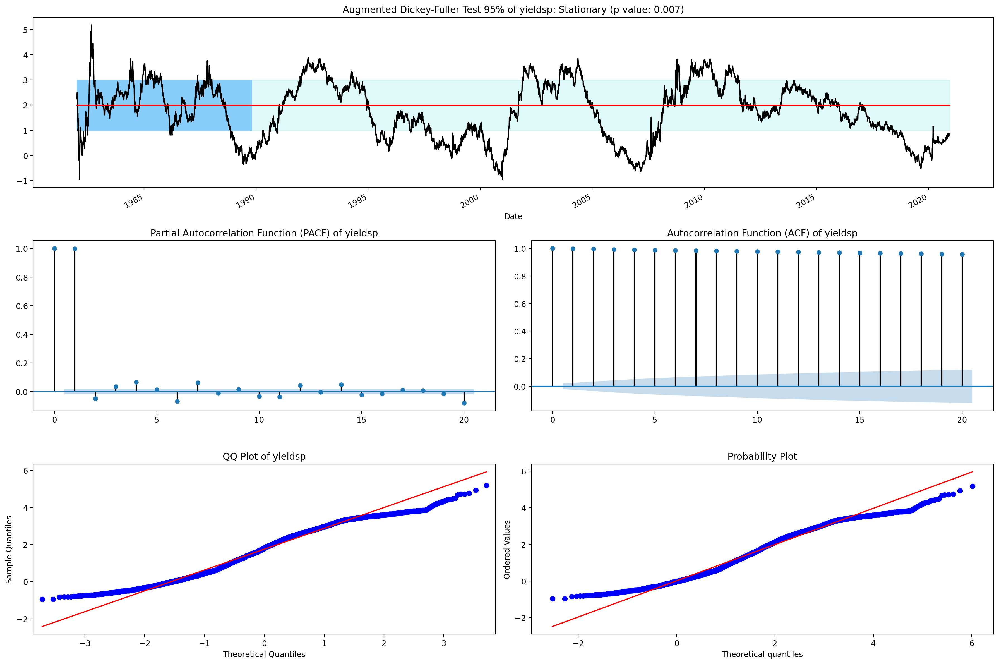

In [34]:
for variable in yieldsp.columns:
    test_stationarity_acf_pacf(yieldsp[variable], sample=0.20, maxlag=20) 

A low p-value of 0.007 indicates that `yieldsp`
is stationary; resulting in `yieldsp` having constant variance and covariance.

The ACF plot shows a strong autocorrelation of lags as spikes very gradually reduce. 

**The PACF shows a significant lag for perhaps 3 days, with significant lags spotty out to perhaps 20 days.** We can try MA(4).

### Stationarity analysis of the differenced yield spread

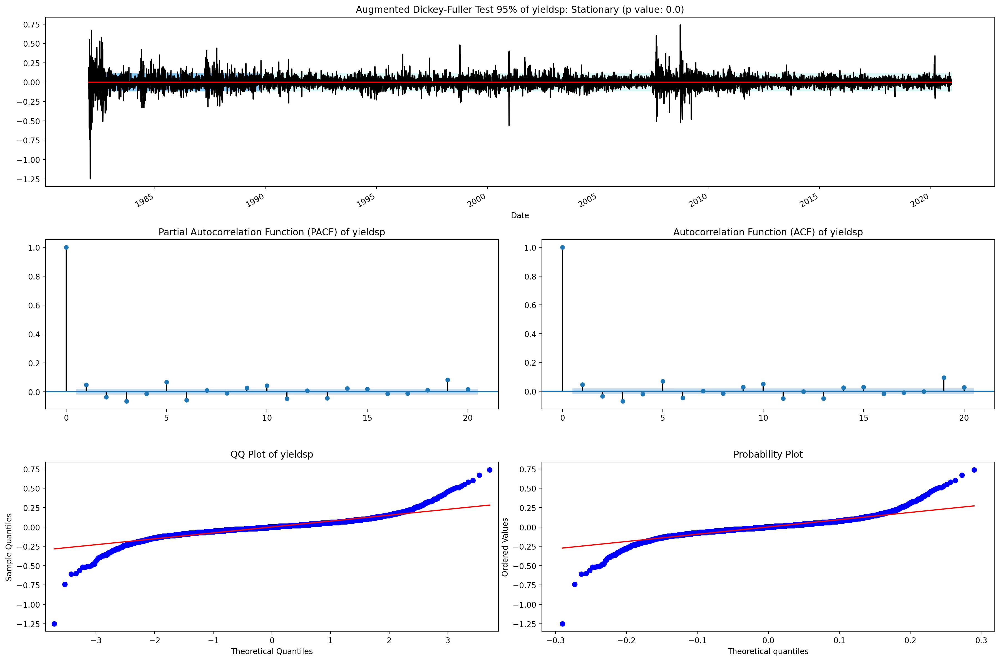

In [35]:
diff = yieldsp['yieldsp'].diff().to_frame()

yield_diff = diff.dropna(inplace = False).replace([np.inf, -np.inf], 0).dropna(axis=1)

for variable in yield_diff.columns:
    test_stationarity_acf_pacf(yield_diff[variable], sample=0.20, maxlag=20)

**From the ACF and PACF plots of the differenced yield curve, we can try AR(3) and MA(3).**

# ARIMA Models

## ARIMA(1,0,3) on yield spread


### Fitting an ARMA(1,0,3) model

In [36]:
X = yieldsp.values
size = int(len(X) * 0.95)
train, test = X[0:size], X[size:len(X)]

# fit model in the whole dataset
model = ARIMA(train, order=(1,0,3))

model_fit_arima = model.fit(disp=0)
print(model_fit_arima.summary())

                              ARMA Model Results                              
Dep. Variable:                      y   No. Observations:                 9253
Model:                     ARMA(1, 3)   Log Likelihood               10592.283
Method:                       css-mle   S.D. of innovations              0.077
Date:                Fri, 25 Dec 2020   AIC                         -21172.567
Time:                        15:34:23   BIC                         -21129.771
Sample:                             0   HQIC                        -21158.025
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.7712      0.328      5.401      0.000       1.128       2.414
ar.L1.y        0.9978      0.001   1454.523      0.000       0.996       0.999
ma.L1.y        0.0438      0.010      4.231      0.0

Fitting the ARIMA(1, 0, 3) model yields the following equation with an AIC of − 20, 952.034 :

$$ yieldsp_t = 1.7712 + 0.9978 yieldsp_{t-1} + 0.0438 \epsilon_{t-1} - 0.0211 \epsilon_{t-2} - 0.0696 \epsilon_{t-3} $$

**Plotting residuals from ARMA(1,0,3) on yield spread**

In [37]:
# plot residual errors
resid_arima = DataFrame(model_fit_arima.resid, columns = ['resid_arima'])
fig_res = resid_arima.iplot(asFigure=True, kind='scatter', xTitle='Index', yTitle='Residuals')


fig_res.update_layout(
    title={
        'text': "Residuals from ARIMA(1,0,3)",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig_res.show()

In [38]:
hist_data = [resid_arima['resid_arima']]
group_labels = ['distplot'] # name of the dataset

fig_kde = ff.create_distplot(hist_data, group_labels, bin_size=0.01)
fig_kde.update_layout(
    title={
        'text': "Histogram, KDE and a Rug Plot of Residuls from ARIMA(1,0,3)",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig_kde.show()

In [39]:
print(resid_arima.describe())

       resid_arima
count  9253.000000
mean     -0.000066
std       0.077213
min      -1.214803
25%      -0.037550
50%      -0.001489
75%       0.036286
max       0.753097


The plots suggest that the errors are Gaussian with a mean centered at approximately zero *(-0.000066)*, indicating no bias in the predictions. The line plot of residuals suggest that the model captures of the trend information. 

### Evaluation using walk forward validation


In [40]:
# we perform a rolling forecast i.e. re-create the ARIMA forecast when a new observation is received. 

X = yieldsp.values
size = int(len(X) * 0.95)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()

# walk-forward validation
for t in range(len(test)):
    model = ARIMA(history, order=(1,0,3))
    model_fit = model.fit(disp=0)
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(yhat)
    obs = test[t]
    history.append(obs)
    print('predicted=%f, expected=%f' % (yhat, obs))
        

predicted=0.154614, expected=0.250000
predicted=0.259821, expected=0.250000
predicted=0.257821, expected=0.270000
predicted=0.267458, expected=0.290000
predicted=0.294739, expected=0.310000
predicted=0.312632, expected=0.280000
predicted=0.280029, expected=0.260000
predicted=0.262132, expected=0.270000
predicted=0.276402, expected=0.300000
predicted=0.305564, expected=0.330000
predicted=0.333266, expected=0.380000
predicted=0.383030, expected=0.310000
predicted=0.307405, expected=0.350000
predicted=0.353337, expected=0.350000
predicted=0.357250, expected=0.370000
predicted=0.370817, expected=0.330000
predicted=0.331424, expected=0.300000
predicted=0.301895, expected=0.280000
predicted=0.285887, expected=0.220000
predicted=0.223226, expected=0.300000
predicted=0.309546, expected=0.310000
predicted=0.316277, expected=0.290000
predicted=0.286803, expected=0.280000
predicted=0.283554, expected=0.230000
predicted=0.233069, expected=0.200000
predicted=0.203641, expected=0.200000
predicted=0.

In [41]:
pred = pd.DataFrame(predictions, columns = ['pred'])
print("Shape of predictions dataframe is {}".format(pred.shape))

#yieldsp.iloc[-len(test):,] 

Shape of predictions dataframe is (488, 1)


In [42]:
pred.index = pd.date_range(start="2019-08-16",end="2020-12-15" )
test = pd.DataFrame(test, columns = ['test_yieldsp'])
# print(pred.shape)
test.index = pd.date_range(start="2019-08-16",end="2020-12-15")
# print(test.shape)
# combine the predictions from leveled ARIMA with the test values
merge = pd.merge(pred, test, how='inner', left_index=True, right_index=True)
merge.tail()
# print(merge.shape)

,pred,test_yieldsp
2020-12-11,0.827924,0.87
2020-12-12,0.875987,0.84
2020-12-13,0.841573,0.82
2020-12-14,0.818819,0.81
2020-12-15,0.814550,0.84


In [43]:
error = sqrt(mean_squared_error(merge['test_yieldsp'], merge['pred']))
print('Test RMSE from the leveled model - ARIMA(1,0,3): %.5f' % error)

Test RMSE from the leveled model - ARIMA(1,0,3): 0.05110


Thus, the final **RMSE for the ARMA(1,0,3) model is 0.05110.**

## ARIMA(3,1,3) on the differenced yield spread

### Fitting an ARIMA(3,1,3) model on `yield_diff`

In [46]:
X_diff = yield_diff.values
size = int(len(X_diff) * 0.95)
train_diff, test_diff = X_diff[0:size], X_diff[size:len(X_diff)]
history = [x for x in train_diff]
predictions = list()

# fit model
model_diff = ARIMA(train_diff, order=(3,1,3))
mod_fit_diff = model_diff.fit(disp=0)
print(mod_fit_diff.summary())

/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



                             ARIMA Model Results                              
Dep. Variable:                    D.y   No. Observations:                 9252
Model:                 ARIMA(3, 1, 3)   Log Likelihood               10578.756
Method:                       css-mle   S.D. of innovations              0.077
Date:                Fri, 25 Dec 2020   AIC                         -21141.512
Time:                        15:56:52   BIC                         -21084.451
Sample:                             1   HQIC                        -21122.122
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const      -7.392e-08    2.8e-07     -0.264      0.791   -6.22e-07    4.74e-07
ar.L1.D.y      0.1647      0.009     18.811      0.000       0.148       0.182
ar.L2.D.y      0.1576      0.039      4.045      0.0

Fitting the ARIMA(3,1, 3) model on the differenced yield spread yields the following equation with an AIC of − 21141.512 :

$$ \Delta yieldsp_t = -7.392*10^{-8} + 0.1647 \Delta yieldsp_{t-1} + 0.1576 \Delta yieldsp_{t-2} -0.0594 \Delta yieldsp_{t-3} - 1.1186 \epsilon_{t-1} - 0.0759 \epsilon_{t-2} + 0.1945 \epsilon_{t-3} $$

**Plotting residuals from ARMA(3,1,3) on yield spread**

In [47]:
# plot residual errors
resid_diff = DataFrame(mod_fit_diff.resid, columns = ['resid_diff'])
fig_res = resid_diff.iplot(asFigure=True, kind='scatter', xTitle='Index', yTitle='Residuals')
fig_res.update_layout(
    title={
        'text': "Residuals from Differenced ARIMA(3,1,3)",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig_res.show()

In [48]:
hist_data = [resid_diff['resid_diff']]
group_labels = ['distplot'] # name of the dataset

fig_kde = ff.create_distplot(hist_data, group_labels, bin_size=0.01)
fig_kde.update_layout(
    title={
        'text': "Histogram, KDE and a Rug Plot of Residuls from Differenced ARIMA(3,1,3)",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig_kde.show()

In [49]:
print(resid_diff.describe())

        resid_diff
count  9252.000000
mean      0.000555
std       0.077457
min      -1.136089
25%      -0.037421
50%      -0.000781
75%       0.037110
max       0.750472


### Evaluation using walk forward validation

In [50]:
# we perform a rolling forecast i.e. re-create the ARIMA forecast when a new observation is received. 

X = yieldsp['yieldsp'].values
size = int(len(X) * 0.95)
train_diff, test_diff = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions_diff = list()
gap = 1

def difference(dataset, interval=1):
	diff = list()
	for i in range(interval, len(dataset)):
		value = dataset[i] - dataset[i - interval]
		diff.append(value)
	return np.array(diff)

diff = difference(X, 1)

def invert_diff(history, yhat, interval=1):
    return yhat + history[-interval]

# walk-forward validation
for t in range(len(test)):
    model_diff = ARIMA(diff, order=(3,1,3))
    model_diff_fit = model_diff.fit(disp=0)
    output = model_diff_fit.forecast()
    yhat = output[0]
    inverted = invert_diff(history, yhat, gap)
    predictions_diff.append(inverted)
    obs = test_diff[t]
    history.append(obs)
    print('predicted=%f, expected=%f' % (inverted, obs))

/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.152550, expected=0.250000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.252550, expected=0.250000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.252550, expected=0.270000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.272550, expected=0.290000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.292550, expected=0.310000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.312550, expected=0.280000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.282550, expected=0.260000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.262550, expected=0.270000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.272550, expected=0.300000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.302550, expected=0.330000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.332550, expected=0.380000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.382550, expected=0.310000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.312550, expected=0.350000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.352550, expected=0.350000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.352550, expected=0.370000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.372550, expected=0.330000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.332550, expected=0.300000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.302550, expected=0.280000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.282550, expected=0.220000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.222550, expected=0.300000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.302550, expected=0.310000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.312550, expected=0.290000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.292550, expected=0.280000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.282550, expected=0.230000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.232550, expected=0.200000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.202550, expected=0.200000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.202550, expected=0.250000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.252550, expected=0.270000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.272550, expected=0.230000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.232550, expected=0.230000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.232550, expected=0.200000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.202550, expected=0.200000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.202550, expected=0.240000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.242550, expected=0.190000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.192550, expected=0.200000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.202550, expected=0.190000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.192550, expected=0.240000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.242550, expected=0.280000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.282550, expected=0.320000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.322550, expected=0.260000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.262550, expected=0.260000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.262550, expected=0.220000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.222550, expected=0.190000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.192550, expected=0.160000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.162550, expected=0.180000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.182550, expected=0.150000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.152550, expected=0.160000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.162550, expected=0.180000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.182550, expected=0.140000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.142550, expected=0.160000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.162550, expected=0.150000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.152550, expected=0.060000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.062550, expected=0.050000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.052550, expected=-0.020000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.017450, expected=-0.030000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.027450, expected=-0.050000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.047450, expected=-0.050000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.047450, expected=-0.040000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.037450, expected=0.010000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.012550, expected=0.060000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.062550, expected=0.060000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.062550, expected=0.080000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.082550, expected=0.070000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.072550, expected=0.060000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.062550, expected=0.090000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.092550, expected=0.090000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.092550, expected=0.050000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.052550, expected=0.080000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.082550, expected=0.120000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.122550, expected=0.120000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.122550, expected=0.170000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.172550, expected=0.150000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.152550, expected=0.150000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.152550, expected=0.150000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.152550, expected=0.120000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.122550, expected=0.090000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.092550, expected=0.110000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.112550, expected=0.090000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.092550, expected=0.100000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.102550, expected=0.080000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.082550, expected=0.090000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.092550, expected=0.080000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.082550, expected=0.110000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.112550, expected=0.070000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.072550, expected=0.020000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.022550, expected=0.060000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.062550, expected=0.020000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.022550, expected=0.040000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.042550, expected=-0.010000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.007450, expected=0.010000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.012550, expected=-0.050000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.047450, expected=0.000000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.002550, expected=0.000000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.002550, expected=0.020000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.022550, expected=0.040000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.042550, expected=0.010000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.012550, expected=-0.060000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.057450, expected=-0.030000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.027450, expected=-0.110000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.107450, expected=-0.120000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.117450, expected=-0.160000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.157450, expected=-0.210000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.207450, expected=-0.280000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.277450, expected=-0.230000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.227450, expected=-0.230000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.227450, expected=-0.210000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.207450, expected=-0.190000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.187450, expected=-0.140000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.137450, expected=-0.120000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.117450, expected=-0.110000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.107450, expected=-0.090000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.087450, expected=-0.110000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.107450, expected=-0.140000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.137450, expected=-0.160000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.157450, expected=-0.150000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.147450, expected=-0.130000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.127450, expected=-0.040000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.037450, expected=-0.110000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.107450, expected=-0.120000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.117450, expected=-0.100000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.097450, expected=-0.130000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.127450, expected=-0.120000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.117450, expected=-0.180000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.177450, expected=-0.220000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.217450, expected=-0.250000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.247450, expected=-0.190000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.187450, expected=-0.210000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.207450, expected=-0.190000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.187450, expected=-0.130000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.127450, expected=-0.040000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.037450, expected=-0.020000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.017450, expected=-0.070000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.067450, expected=-0.020000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.017450, expected=-0.080000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.077450, expected=-0.010000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.007450, expected=-0.010000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.007450, expected=-0.040000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.037450, expected=0.020000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.022550, expected=-0.050000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.047450, expected=-0.020000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.017450, expected=-0.040000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.037450, expected=-0.060000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.057450, expected=-0.020000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.017450, expected=-0.060000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.057450, expected=-0.170000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.167450, expected=-0.200000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.197450, expected=-0.300000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.297450, expected=-0.320000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.317450, expected=-0.310000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.307450, expected=-0.300000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.297450, expected=-0.260000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.257450, expected=-0.350000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.347450, expected=-0.320000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.317450, expected=-0.370000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.367450, expected=-0.390000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.387450, expected=-0.320000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.317450, expected=-0.340000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.337450, expected=-0.390000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.387450, expected=-0.380000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.377450, expected=-0.380000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.377450, expected=-0.450000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.447450, expected=-0.470000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.467450, expected=-0.490000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.487450, expected=-0.520000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.517450, expected=-0.490000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.487450, expected=-0.490000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.487450, expected=-0.510000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.507450, expected=-0.500000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.497450, expected=-0.400000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.397450, expected=-0.410000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.407450, expected=-0.330000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.327450, expected=-0.230000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.227450, expected=-0.210000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.207450, expected=-0.160000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.157450, expected=-0.060000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.057450, expected=-0.150000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.147450, expected=-0.180000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.177450, expected=-0.150000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.147450, expected=-0.140000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.137450, expected=-0.170000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.167450, expected=-0.220000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.217450, expected=-0.280000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.277450, expected=-0.160000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.157450, expected=-0.130000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.127450, expected=-0.110000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.107450, expected=-0.200000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.197450, expected=-0.170000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.167450, expected=-0.190000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.187450, expected=-0.160000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.157450, expected=-0.190000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.187450, expected=-0.190000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.187450, expected=-0.180000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.177450, expected=-0.100000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.097450, expected=-0.010000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.007450, expected=0.080000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.082550, expected=0.100000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.102550, expected=0.090000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.092550, expected=0.100000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.102550, expected=0.100000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.102550, expected=0.130000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.132550, expected=0.130000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.132550, expected=0.120000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.122550, expected=0.100000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.102550, expected=0.140000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.142550, expected=0.200000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.202550, expected=0.210000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.212550, expected=0.160000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.162550, expected=0.150000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.152550, expected=0.210000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.212550, expected=0.260000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.262550, expected=0.300000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.302550, expected=0.250000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.252550, expected=0.360000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.362550, expected=0.390000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.392550, expected=0.330000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.332550, expected=0.310000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.312550, expected=0.250000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.252550, expected=0.270000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.272550, expected=0.240000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.242550, expected=0.220000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.222550, expected=0.160000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.162550, expected=0.190000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.192550, expected=0.190000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.192550, expected=0.150000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.152550, expected=0.140000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.142550, expected=0.150000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.152550, expected=0.190000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.192550, expected=0.230000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.232550, expected=0.150000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.152550, expected=0.220000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.222550, expected=0.260000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.262550, expected=0.310000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.312550, expected=0.290000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.292550, expected=0.290000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.292550, expected=0.220000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.222550, expected=0.340000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.342550, expected=0.250000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.252550, expected=0.320000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.322550, expected=0.330000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.332550, expected=0.360000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.362550, expected=0.350000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.352550, expected=0.340000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.342550, expected=0.340000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.342550, expected=0.320000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.322550, expected=0.320000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.322550, expected=0.310000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.312550, expected=0.330000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.332550, expected=0.370000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.372550, expected=0.340000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.342550, expected=0.280000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.282550, expected=0.250000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.252550, expected=0.290000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.292550, expected=0.330000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.332550, expected=0.310000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.312550, expected=0.290000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.292550, expected=0.280000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.282550, expected=0.250000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.252550, expected=0.220000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.222550, expected=0.260000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.262550, expected=0.280000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.282550, expected=0.220000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.222550, expected=0.220000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.222550, expected=0.190000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.192550, expected=0.160000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.162550, expected=0.060000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.062550, expected=0.080000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.082550, expected=0.040000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.042550, expected=0.000000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.002550, expected=-0.040000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.037450, expected=-0.030000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.027450, expected=0.040000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.042550, expected=0.090000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.092550, expected=0.080000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.082550, expected=0.030000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.032550, expected=-0.020000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.017450, expected=0.020000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.022550, expected=0.040000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.042550, expected=0.020000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.022550, expected=0.010000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.012550, expected=-0.030000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.027450, expected=-0.020000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.017450, expected=-0.060000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.057450, expected=-0.100000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.097450, expected=-0.150000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.147450, expected=-0.200000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.197450, expected=-0.200000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.197450, expected=-0.150000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.147450, expected=-0.140000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.137450, expected=-0.030000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=-0.027450, expected=0.070000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.072550, expected=0.300000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.302550, expected=0.300000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.302550, expected=0.290000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.292550, expected=0.210000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.212550, expected=0.320000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.322550, expected=0.400000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.402550, expected=0.550000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.552550, expected=0.660000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.662550, expected=0.490000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.492550, expected=0.830000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.832550, expected=1.160000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=1.162550, expected=1.080000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=1.082550, expected=0.870000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.872550, expected=0.740000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.742550, expected=0.830000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.832550, expected=0.880000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.882550, expected=0.830000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.832550, expected=0.690000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.692550, expected=0.580000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.582550, expected=0.590000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.592550, expected=0.530000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.532550, expected=0.540000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.542550, expected=0.520000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.522550, expected=0.520000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.522550, expected=0.610000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.612550, expected=0.550000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.552550, expected=0.480000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.482550, expected=0.500000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.502550, expected=0.560000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.562550, expected=0.490000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.492550, expected=0.470000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.472550, expected=0.530000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.532550, expected=0.510000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.512550, expected=0.470000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.472550, expected=0.510000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.512550, expected=0.500000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.502550, expected=0.480000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.482550, expected=0.550000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.552550, expected=0.510000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.512550, expected=0.530000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.532550, expected=0.550000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.552550, expected=0.520000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.522550, expected=0.510000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.512550, expected=0.530000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.532550, expected=0.600000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.602550, expected=0.520000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.522550, expected=0.570000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.572550, expected=0.610000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.612550, expected=0.560000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.562550, expected=0.510000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.512550, expected=0.510000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.512550, expected=0.520000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.522550, expected=0.600000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.602550, expected=0.570000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.572550, expected=0.560000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.562550, expected=0.560000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.562550, expected=0.540000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.542550, expected=0.550000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.552550, expected=0.530000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.532550, expected=0.550000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.552550, expected=0.510000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.512550, expected=0.520000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.522550, expected=0.530000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.532550, expected=0.610000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.612550, expected=0.670000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.672550, expected=0.760000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.762550, expected=0.710000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.712550, expected=0.650000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.652550, expected=0.580000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.582550, expected=0.490000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.492550, expected=0.550000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.552550, expected=0.530000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.532550, expected=0.580000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.582550, expected=0.570000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.572550, expected=0.550000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.552550, expected=0.550000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.552550, expected=0.550000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.552550, expected=0.560000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.562550, expected=0.540000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.542550, expected=0.520000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.522550, expected=0.500000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.502550, expected=0.500000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.502550, expected=0.500000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.502550, expected=0.550000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.552550, expected=0.540000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.542550, expected=0.540000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.542550, expected=0.500000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.502550, expected=0.520000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.522550, expected=0.490000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.492550, expected=0.520000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.522550, expected=0.500000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.502550, expected=0.480000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.482550, expected=0.480000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.482550, expected=0.510000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.512550, expected=0.530000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.532550, expected=0.490000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.492550, expected=0.480000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.482550, expected=0.470000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.472550, expected=0.470000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.472550, expected=0.480000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.482550, expected=0.510000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.512550, expected=0.480000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.482550, expected=0.470000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.472550, expected=0.460000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.462550, expected=0.460000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.462550, expected=0.460000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.462550, expected=0.430000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.432550, expected=0.450000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.452550, expected=0.450000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.452550, expected=0.470000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.472550, expected=0.480000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.482550, expected=0.530000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.532550, expected=0.580000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.582550, expected=0.610000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.612550, expected=0.610000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.612550, expected=0.590000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.592550, expected=0.580000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.582550, expected=0.570000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.572550, expected=0.540000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.542550, expected=0.540000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.542550, expected=0.530000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.532550, expected=0.580000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.582550, expected=0.580000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.582550, expected=0.630000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.632550, expected=0.640000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.642550, expected=0.610000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.612550, expected=0.560000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.562550, expected=0.540000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.542550, expected=0.520000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.522550, expected=0.610000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.612550, expected=0.560000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.562550, expected=0.590000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.592550, expected=0.560000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.562550, expected=0.560000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.562550, expected=0.570000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.572550, expected=0.570000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.572550, expected=0.570000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.572550, expected=0.600000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.602550, expected=0.600000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.602550, expected=0.580000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.582550, expected=0.580000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.582550, expected=0.570000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.572550, expected=0.570000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.572550, expected=0.560000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.562550, expected=0.560000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.562550, expected=0.570000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.572550, expected=0.590000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.592550, expected=0.590000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.592550, expected=0.610000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.612550, expected=0.680000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.682550, expected=0.660000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.662550, expected=0.710000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.712550, expected=0.690000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.692550, expected=0.690000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.692550, expected=0.630000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.632550, expected=0.610000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.612550, expected=0.630000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.632550, expected=0.650000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.652550, expected=0.670000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.672550, expected=0.710000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.712550, expected=0.730000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.732550, expected=0.780000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.782550, expected=0.750000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.752550, expected=0.700000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.702550, expected=0.690000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.692550, expected=0.690000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.692550, expected=0.760000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.762550, expected=0.790000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.792550, expected=0.780000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.782550, expected=0.800000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.802550, expected=0.680000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.682550, expected=0.690000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.692550, expected=0.730000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.732550, expected=0.850000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.852550, expected=0.880000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.882550, expected=0.780000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.782550, expected=0.800000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.802550, expected=0.820000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.822550, expected=0.780000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.782550, expected=0.790000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.792550, expected=0.790000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.792550, expected=0.760000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.762550, expected=0.780000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.782550, expected=0.790000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.792550, expected=0.790000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.792550, expected=0.750000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.752550, expected=0.760000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.762550, expected=0.830000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.832550, expected=0.860000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.862550, expected=0.840000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.842550, expected=0.880000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.882550, expected=0.860000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.862550, expected=0.830000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.832550, expected=0.870000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.872550, expected=0.840000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.842550, expected=0.820000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



predicted=0.822550, expected=0.810000
predicted=0.812550, expected=0.840000


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



In [51]:
pred_inv = pd.DataFrame(predictions_diff, columns = ['pred_diff'])
pred_inv.index = pd.date_range(start="2019-08-16",end="2020-12-15" )
merge_inv = pd.merge(pred_inv, merge, how='inner', left_index=True, right_index=True)
merge_inv.tail()

,pred_diff,pred,test_yieldsp
2020-12-11,0.83255,0.827924,0.87
2020-12-12,0.87255,0.875987,0.84
2020-12-13,0.84255,0.841573,0.82
2020-12-14,0.82255,0.818819,0.81
2020-12-15,0.81255,0.814550,0.84


In [52]:
# calculate RMSE
rmse = sqrt(mean_squared_error(merge_inv['test_yieldsp'], merge_inv['pred_diff']))
print('Test RMSE from the differenced model - ARIMA(3,1,3): %.5f' % rmse)

Test RMSE from the differenced model - ARIMA(3,1,3): 0.05147


Thus, the final **RMSE for the ARMA(1,0,3) model is 0.05147.**

##  ARIMA(1,0,3) vs ARIMA(3,1,3)

**Descriptive statistics of the residuals from both ARIMA models**

|   | Residuals from ARIMA(1, 0, 3)           | Residuals from Difference ARIMA(3, 1, 3)  |
| :-------------: |:-------------:| :-----:|
| mean     | -0.000066 | 0.000555  |
| std      |  0.077213      |  0.077457 |
| min | -1.214803   |   -1.136089 |
| 25% | -0.037550 | -0.037421 |
| 50%   |   -0.001489 | -0.000781 |
| 75%  |      0.036286 | 0.037110 | 
| max     |   0.753097 | 0.750472 |




**Plotting the ARIMA(1,0,3) model on yield spread vs ARIMA(3,1,3) model on the differenced yield spread**

In [53]:
# line plot shows that compares the actual yieldsp with rolling forecast predictions from leveled and diff ARIMA
fig_arima_diff = merge_inv.iplot(asFigure=True, kind='scatter', xTitle='Date', 
                                 yTitle='Predicted and Actual Yield Spread')
fig_arima_diff.update_layout(
    title={
        'text': "Actual and Forecasted Yield Spread from ARIMA(1,0,3) and ARIMA(3,1,3)",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig_arima_diff.show()

# ARCH and GARCH Models

The author uses (G)ARCH models that treat heteroskedasticity by modeling the variance.



```
Empirically, after constructing ARIMA, we can use (G)ARCH to model the expected variance on the residuals, 
provided that the residuals are not serially correlated and don't have any trend and seasonal patterns.
```



When fitting an AR(p), we observe the decay of the $p$ lag displayed in the ACF plot of the residuals and the squared residuals. To apply ARCH we need to ensure that the mean of the residuals = 0. 

In [55]:
resid_arima['resid_arima_squared'] = resid_arima['resid_arima']**2 
resid_arima.head()

,resid_arima,resid_arima_squared
0,0.548815,0.301198
1,-0.078649,0.006186
2,0.194757,0.037930
3,0.020966,0.000440
4,0.039273,0.001542


**Checking stationarity for resid_arima and resid_arima_squared**

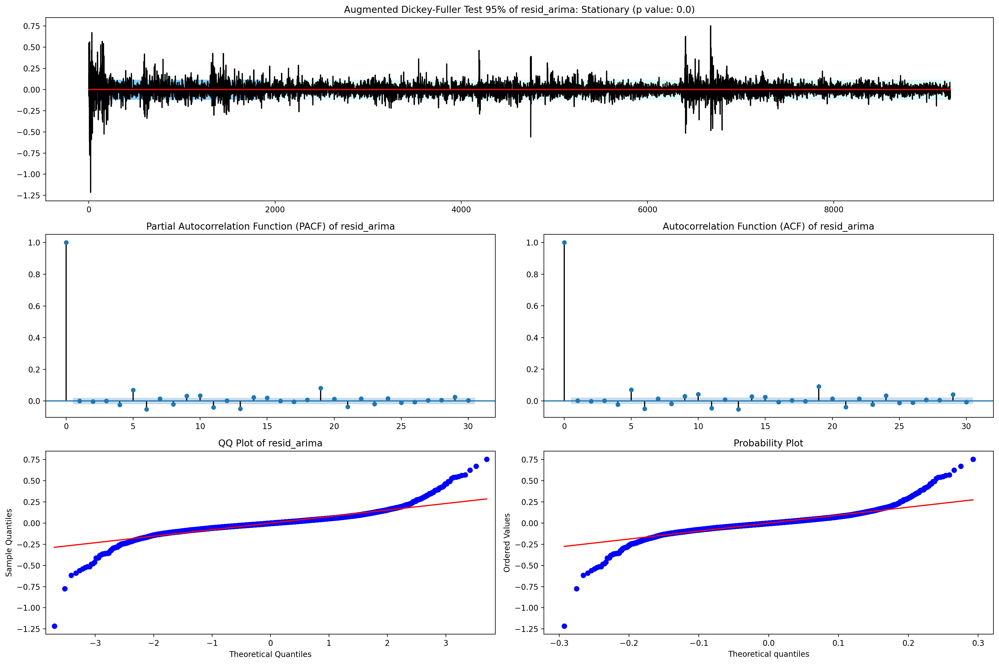

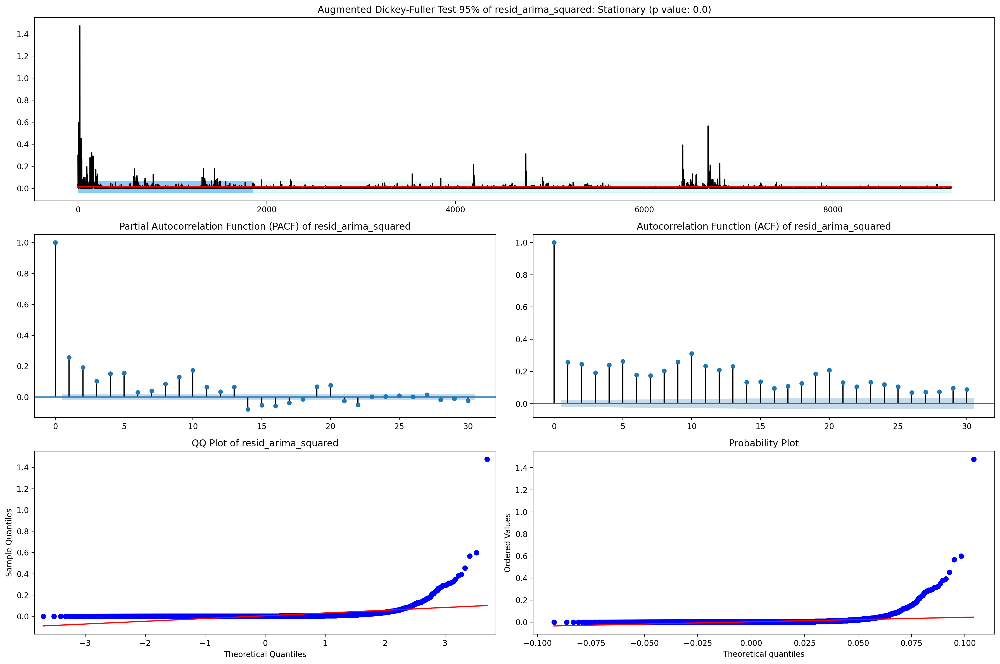

In [56]:
for variable in resid_arima.columns:
    test_stationarity_acf_pacf(resid_arima[variable], sample=0.20, maxlag=30)                   

* Whilst the residuals from ARIMA(1,0,3) appear to be white noise process, the squared residuals are highly autocorrelated. 

* The slow decay of successive lags indicate conditional heteroskedasticity.


### Fitting an ARCH(1,0,3) model 


Given that the lags in both the PACF and ACF plots are significant, the model would be better fit with both AR and MA parameters. So, we  have fit a GARCH(1,3) model and checked how the residuals from GARCH(1,3) behave. 

In [57]:
# Now we can fit the arch model using the best fit arima model parameters
ar = arch_model(resid_arima['resid_arima'], p=1, o=0, q=3, power=1.0)
res = ar.fit(update_freq=5)
print(res.summary())

Iteration:      5,   Func. Count:     62,   Neg. LLF: -12300.528985841454
Iteration:     10,   Func. Count:    107,   Neg. LLF: -12453.98029286434
Iteration:     15,   Func. Count:    148,   Neg. LLF: -12467.454046611692
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -12467.459248161376
            Iterations: 18
            Function evaluations: 164
            Gradient evaluations: 17
                    Constant Mean - AVGARCH Model Results                     
Dep. Variable:            resid_arima   R-squared:                      -0.001
Mean Model:             Constant Mean   Adj. R-squared:                 -0.001
Vol Model:                    AVGARCH   Log-Likelihood:                12467.5
Distribution:                  Normal   AIC:                          -24922.9
Method:            Maximum Likelihood   BIC:                          -24880.1
                                        No. Observations:                 9253
Date:        

We can see that the true parameters:  $\Omega, \alpha, \beta_1, \beta_2, \beta_3$, **fall within the respective confidence intervals**.

Thus, we can write GARCH(1, 3) as:

$$ \sigma_t^2 = 1.7556*10^{-03} + 0.1142 \sigma_{t-1}^2 + 0.8 \epsilon_{t-1}^2 + 7.4291*10^{-12} \epsilon_{t-2}^2 + 0.0859 \epsilon_{t-3}^2 $$

In [58]:
resid_garch = pd.DataFrame(res.resid).rename(columns = {'resid': 'resid_garch'})
resid_garch['resid_garch_sq'] = resid_garch['resid_garch']**2
resid_garch.head()

,resid_garch,resid_garch_sq
0,0.550813,0.303395
1,-0.076651,0.005875
2,0.196755,0.038713
3,0.022964,0.000527
4,0.041271,0.001703


### Stationarity analysis of `resid_garch` and `resid_garch_squared`

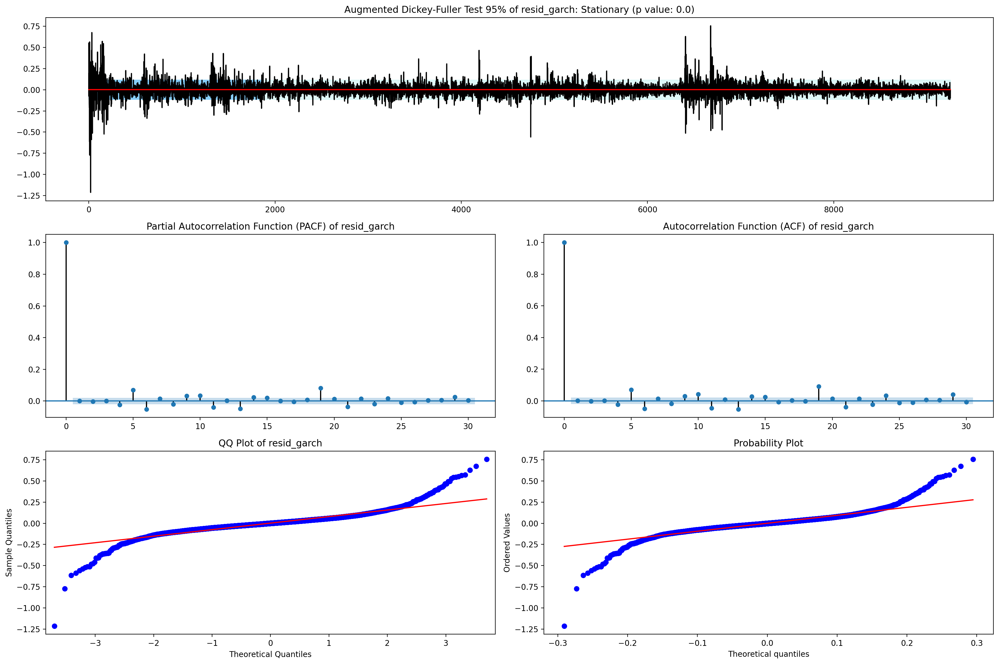

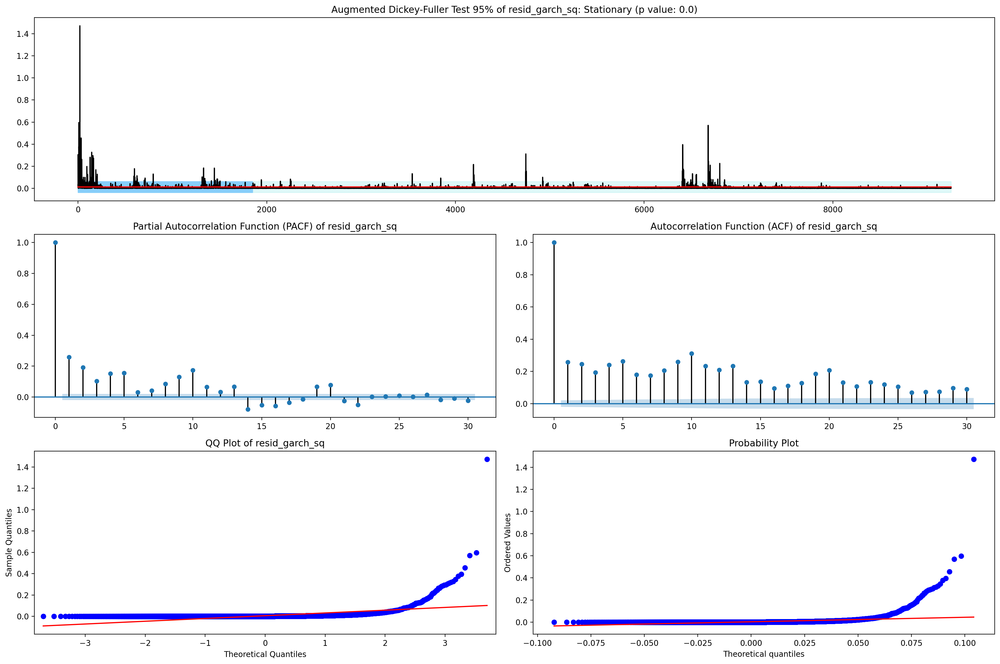

In [59]:
for variable in resid_garch.columns:
    test_stationarity_acf_pacf(resid_garch[variable], sample=0.20, maxlag=30) 

* The residuls (from GARCH) plot looks like a realisation of a discrete white noise process, indicating a good fit. 
* But, the squared residuals are still not white noise. 

So, **GARCH(1, 3)** has not  "explained" the serial correlation present in the squared residuals, inhibiting us from predicting in the test set.

# Multivariate forecasting

The author uses the following exogenous variables to forecast the yeild spread:

1. [Real-time Sahm Rule recession indicator](https://fred.stlouisfed.org/release?rid=456) − `sahm`
2. [Fitted instantaneous forward rate 1-year rate hence](https://quant.stackexchange.com/questions/42929/what-does-instantaneous-forward-mean) − `forward1yr`
3. [NBER based recession indicator](https://fred.stlouisfed.org/series/USREC#:~:text=Our%20time%20series%20is%20composed,period%20that%20turning%20points%20occurred.&text=A%20value%20of%201%20is,0%20is%20an%20expansionary%20period.) − `rec_ind`
4. [Term premium on a 10-year zero coupon bond](https://fred.stlouisfed.org/series/THREEFYTP10) − `termpr`
5. [University of Michigan Inflation Expectations](https://in.investing.com/economic-calendar/michigan-inflation-expectations-389) − `infexp`
6. [CBOE Volatility Index](https://www.investopedia.com/terms/v/vix.asp) − `vix`
7. [TED spread](https://www.investopedia.com/terms/t/tedspread.asp#:~:text=The%20TED%20spread%20is%20the,interest%20rate%20on%20interbank%20loans.) − `ted`
8. [1-year Treasury constant maturity minus the federal funds rate](https://fred.stlouisfed.org/series/T1YFF) − `1yrff`

### Gathering the exogenous variables

In [61]:
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')

week = ["FRED/CCSA", # UI claims - weekly;
    
        "FRED/WALCL", # Total Assets (Less Eliminations From Consolidation) - weekly;
    
        "FRED/RPONTSYD"] # Overnight Repurchase Agreements: Treasury Securities Purchased by Fed in OMO - weekly
    

In [62]:
daily = [
    
    "FRED/T10Y3M", # 10 year treasury constant maturity - 3 month tres cons mat
    
    "FRED/TEDRATE",  # TED Spread - daily ;
    
    "FRED/THREEFF1" , # Fitted Instantaneous Forward Rate 1 Year Hence - daily;
    
    "FRED/USRECD", # NBER based recession indicator - daily
    
    "FRED/T1YFF" , # 1-Year Treasury Constant Maturity Minus Federal Funds Rate
    
    "FRED/THREEFYTP10" ] # Term Premium on a 10 Year Zero Coupon Bond - daily

yieldd = quandl.get(daily, start_date = "1990-01-01", end_date="2020-10-01", collapse = 'daily',date_parser=parser)
yieldd.columns = [
                  'yieldsp',
                  'ted', 
                  'forward1yr',
                  'rec_ind',
                  '1yr-ffr',
                  'termpr'
                  ]
   
yieldd = yieldd.fillna(method = 'bfill')
yieldd.tail()

,yieldsp,ted,forward1yr,rec_ind,1yr-ffr,termpr
Date,,,,,,
2020-09-27,0.56,0.11,0.1757,1.0,0.03,-0.8797
2020-09-28,0.56,0.11,0.1757,1.0,0.03,-0.8797
2020-09-29,0.57,0.14,0.1713,1.0,0.03,-0.8838
2020-09-30,0.59,0.13,0.1811,1.0,0.03,-0.8731
2020-10-01,0.59,0.14,0.1811,1.0,0.03,-0.8710


In [63]:
fredf = {}
fredf['sahm'] = fred.get_series('SAHMREALTIME', observation_start='1990-01-01', observation_end='2020-10-01')
fredf['infexp'] = fred.get_series('MICH', observation_start='1990-01-01', observation_end='2020-10-01')
fredf['vix'] = fred.get_series('VIXCLS', observation_start='1990-01-01', observation_end='2020-10-01')
fredf = pd.DataFrame(fredf)

# apply cubic spline interpolation to get daily value of sahm rule from monthly values
# bfill = use next valid observation to fill gap.
upsample = fredf.resample('D').interpolate(method='cubic').fillna(method = 'bfill')
upsample.index.name = 'Date'
upsample.tail()

,sahm,infexp,vix
Date,,,
2020-09-27,4.370888,2.519419,25.691582
2020-09-28,4.329146,2.536514,26.190000
2020-09-29,4.286764,2.555607,26.270000
2020-09-30,4.243722,2.576751,26.370000
2020-10-01,4.200000,2.600000,26.700000


In [64]:
yield_d = pd.merge(yieldd, upsample, on = 'Date')
yield_d.head()

,yieldsp,ted,forward1yr,rec_ind,1yr-ffr,termpr,sahm,infexp,vix
Date,,,,,,,,,
1990-01-01,0.11,0.80,7.8401,0.0,-0.73,1.6625,0.130000,4.100000,17.24
1990-01-02,0.11,0.80,7.8401,0.0,-0.73,1.6625,0.132076,4.121014,17.24
1990-01-03,0.10,0.75,7.8880,0.0,-0.52,1.6865,0.133962,4.140169,18.19
1990-01-04,0.14,0.79,7.8773,0.0,-0.47,1.6890,0.135664,4.157512,19.22
1990-01-05,0.20,0.84,7.8694,0.0,-0.41,1.7017,0.137187,4.173091,20.11


In [65]:
yield_d.isnull().sum()

yieldsp       0
ted           0
forward1yr    0
rec_ind       0
1yr-ffr       0
termpr        0
sahm          0
infexp        0
vix           0
dtype: int64

## D’Agostino’s $K^2$ Test

We use goodness-of-fit measure : the [D’Agostino’s $K^2$ Test](https://en.wikipedia.org/wiki/D%27Agostino%27s_K-squared_test) to check if the sample data on the yield spread arises from a Gaussian distributed population. Transforming the sample skewness and kurtosis derives the test statistic. 



**Test statistic:**

```
Ho: data is normally distributed
Ha: data is kurtic and/or skewed (not normally distributed)
```

In [66]:
from scipy import stats
stat, p = stats.normaltest(yield_d.yieldsp)
print('Statistics=%.3f, p=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Data looks Gaussian (fail to reject H0)')
else:
    print('Data does not look Gaussian (reject H0)')

Statistics=3205.902, p=0.000
Data does not look Gaussian (reject H0)


The small p-value of 0.00 rejects the null hypothesis. Hence, the sample of yield spread is **not normally distributed.**

In [67]:
hist_data = [yield_d.yieldsp]
group_labels = ['distplot'] 

fig_kde = ff.create_distplot(hist_data, group_labels, bin_size=0.01)
fig_kde.update_layout(
    title={
        'text': "Histogram, KDE and a Rug Plot of the Yield Spread",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig_kde.show()

In [68]:
# calculate kurtosis and skewness, to determine if the data distribution departs from the normal distribution.
print( 'Kurtosis of normal distribution: {}'.format(stats.kurtosis(yield_d.yieldsp)))
print( 'Skewness of normal distribution: {}'.format(stats.skew(yield_d.yieldsp)))

Kurtosis of normal distribution: -1.039932153725899
Skewness of normal distribution: -0.056269426368131585


The yield spread data is moderately skewed as its [skewness](https://en.wikipedia.org/wiki/Skewness) is -0.0562, and has heavy tails (very kurtotic) becasue the [kurtosis](https://en.wikipedia.org/wiki/Kurtosis) is -1.0399.

## Exploring the Stationarity of the Variables


### Augmented Dickey Fuller test of the variables

In [69]:
def adfuller_test(series, signif = 0.05, name = '', verbose = False):
    """
        Perform ADFuller to test for stationarity of a given series and print report
    """
    
    r = adfuller(series, autolag = 'AIC')
    output = {'test_statistic': round(r[0], 4), 'pvalue': round(r[1], 4), 'n_lags':round(r[2], 4), 'n_obs':r[3]}
    p_value = output['pvalue']

    def adjust(val, length = 6): 
        return str(val).ljust(length)
    
    print(f'     Augmented Dickey-Fuller Test on "{name}"', "\n    ", '-'*47)
    print(f'  Null Hypothesis: Data has unit too. Non-Stationary.')
    print(f'  Significance Level    = {signif}')
    print(f'  Test Statistic        = {output["test_statistic"]}')
    print(f'  No. of Lags Chosen    = {output["n_lags"]}')
          
    for key, val in r[4].items():
          print(f'  Critical Value {adjust(key)} = {round(val, 3)}')
          
    if p_value <= signif:
          print(f" => P-Value = {p_value}. Rejecting null hypothesis.")
          print(f" => Series is stationary.")
    else:
          print(f" => P-Value = {p_value}. Weak evidence to reject the Null Hypothesis.")
          print(f" => Series is non-stationary.")
 

In [70]:
data_list = yield_d[list(yield_d.columns)]

for name, column in data_list.iteritems():
          adfuller_test(column, name = column.name)
          print('\n')

     Augmented Dickey-Fuller Test on "yieldsp" 
     -----------------------------------------------
  Null Hypothesis: Data has unit too. Non-Stationary.
  Significance Level    = 0.05
  Test Statistic        = -2.4551
  No. of Lags Chosen    = 30
  Critical Value 1%     = -3.431
  Critical Value 5%     = -2.862
  Critical Value 10%    = -2.567
 => P-Value = 0.1268. Weak evidence to reject the Null Hypothesis.
 => Series is non-stationary.


     Augmented Dickey-Fuller Test on "ted" 
     -----------------------------------------------
  Null Hypothesis: Data has unit too. Non-Stationary.
  Significance Level    = 0.05
  Test Statistic        = -5.1091
  No. of Lags Chosen    = 39
  Critical Value 1%     = -3.431
  Critical Value 5%     = -2.862
  Critical Value 10%    = -2.567
 => P-Value = 0.0. Rejecting null hypothesis.
 => Series is stationary.


     Augmented Dickey-Fuller Test on "forward1yr" 
     -----------------------------------------------
  Null Hypothesis: Data has uni


| Variable      | p -Value | Stationary? |
| :------------------: | :------------------: | :------------------: |
| yieldsp  | 0.1268    | No       |
| ted   | 0.000 | Yes        |
| forward1yr | 0.5191 | No |
| rec_ind | 0.0035 | Yes |
| 1yr-ffr | 0.000 |Yes |
| termpr | 0.595 | No |
| sahm | 0.000 | Yes |
| infexp | 0.000 |Yes |
| vix | 0.000 |Yes |

Here, I get results different from the author for `sahm`.



### Stationarizing variables by taking first diff

In [71]:
# stationarizes the variables by taking the first difference, and concats them with the dataset
yield_d1 = pd.concat([yield_d, yield_d[['forward1yr','termpr','yieldsp']]
                      .diff().add_suffix("_diff")], axis = 1)

# drops rows with NaN values, and replaces inf values with 0
stat1 = yield_d1.dropna(inplace = False).replace([np.inf, -np.inf], 0).dropna(axis=1)

### AD Fuller test on the differenced variables

I have done AD Fuller test on the differenced variables once again to verify that they are stationary. 

In [72]:
stat_list1 = stat1[['forward1yr_diff', 'termpr_diff','yieldsp_diff']]

# ADF Test on the first differenced values each column
for name, column in stat_list1.iteritems():
          adfuller_test(column, name = column.name)
          print('\n')

     Augmented Dickey-Fuller Test on "forward1yr_diff" 
     -----------------------------------------------
  Null Hypothesis: Data has unit too. Non-Stationary.
  Significance Level    = 0.05
  Test Statistic        = -54.7771
  No. of Lags Chosen    = 2
  Critical Value 1%     = -3.431
  Critical Value 5%     = -2.862
  Critical Value 10%    = -2.567
 => P-Value = 0.0. Rejecting null hypothesis.
 => Series is stationary.


     Augmented Dickey-Fuller Test on "termpr_diff" 
     -----------------------------------------------
  Null Hypothesis: Data has unit too. Non-Stationary.
  Significance Level    = 0.05
  Test Statistic        = -54.4446
  No. of Lags Chosen    = 2
  Critical Value 1%     = -3.431
  Critical Value 5%     = -2.862
  Critical Value 10%    = -2.567
 => P-Value = 0.0. Rejecting null hypothesis.
 => Series is stationary.


     Augmented Dickey-Fuller Test on "yieldsp_diff" 
     -----------------------------------------------
  Null Hypothesis: Data has unit too. 

Thus, we have the following:

|   |   |
| :---: | :---: |
| **Stationary Variables** | `ted`, `rec_ind`, `1yr-ffr`, `vix`, `infexp`, `sahm` |
|**Variables that need first differencing** | `forward1yr`, `termpr`, `yieldsp` |

# ARIMA with Exogenous variables : SARIMAX(2,1,2)

The author has modeled SARIMAX(2,1,2) without any seasonal component and incorporated the stationary exogenous variables.

In [75]:
train, test = np.split(stat1, [int(.95 *len(stat1))])

exog_train = train[['ted', 'rec_ind', '1yr-ffr', 'vix', 'termpr_diff', 'forward1yr_diff', 'infexp']]
exog_test = test[['ted', 'rec_ind', '1yr-ffr', 'vix', 'termpr_diff','forward1yr_diff', 'infexp']]

In [76]:
exog = stat1[['ted', 'rec_ind', '1yr-ffr', 'vix', 'termpr', 'forward1yr', 'infexp', 'sahm', '1yr-ffr']]
exog_test_sarima = test[['ted', 'rec_ind', '1yr-ffr', 'vix', 'termpr', 'forward1yr', 'infexp', 'sahm', '1yr-ffr']]

mod = sm.tsa.statespace.SARIMAX(stat1['yieldsp'], exog = exog,
                                order = (2, 1, 2),
                                seasonal_order = (0, 0, 0, 0),
                                enforce_stationarity = True,
                                enforce_invertibility = True)

results = mod.fit()

print(results.summary())

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                           Statespace Model Results                           
Dep. Variable:                yieldsp   No. Observations:                11231
Model:               SARIMAX(2, 1, 2)   Log Likelihood               24898.307
Date:                Fri, 25 Dec 2020   AIC                         -49768.613
Time:                        16:57:16   BIC                         -49666.045
Sample:                    01-02-1990   HQIC                        -49734.094
                         - 10-01-2020                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ted            0.4031      0.002    248.608      0.000       0.400       0.406
rec_ind       -0.0072      0.020     -0.367      0.714      -0.046       0.031
1yr-ffr        0.0065      0.000     16.714      0.0

The SARIMAX(2,1,2) model is:

$$ yieldsp_t = 0.4031 ted_t -0.0072 \text{rec_ind}_t + 0.0065 \text{1yrffr}_t - 0.0002 vix_t + 2.4013 \Delta termpr_t - 0.4190  \Delta forward1yr_t - 0.0168 \text{infexp}_t + 0.0259 sahm_t + 0.0065 \text{1yrffr}_t + 1.0625 yieldsp_{t-1} - 0.6652 yieldsp_{t-2} - 0.9914 \epsilon_{t-1} + 0.5403 \epsilon_{t-2}$$

with an AIC of -49768.613

### Model Diagnostics

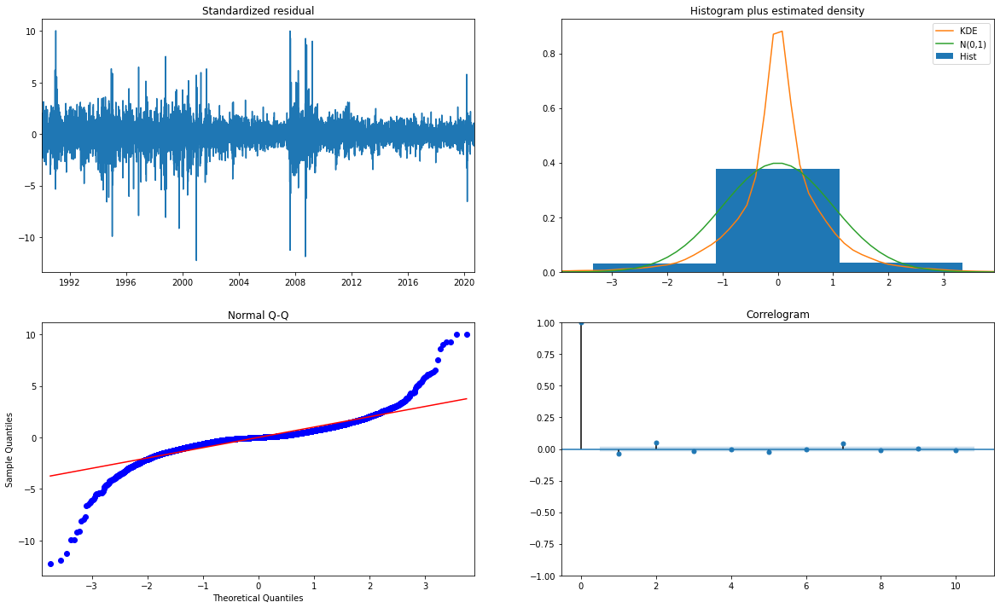

In [77]:
# run model diagnostics to ensure that none of the assumptions made by the model have been violated.
results.plot_diagnostics(figsize=(20, 12))
plt.show()

### Forecasting using SARIMAX(2,1,2)

In [78]:
pred_dynamic = results.get_prediction(start = pd.to_datetime('2018-11-24'), dynamic = True, 
                                      exog = exog_test_sarima, full_results = True)
                                      
pred_dynamic_ci = pred_dynamic.conf_int(exog = exog_test)

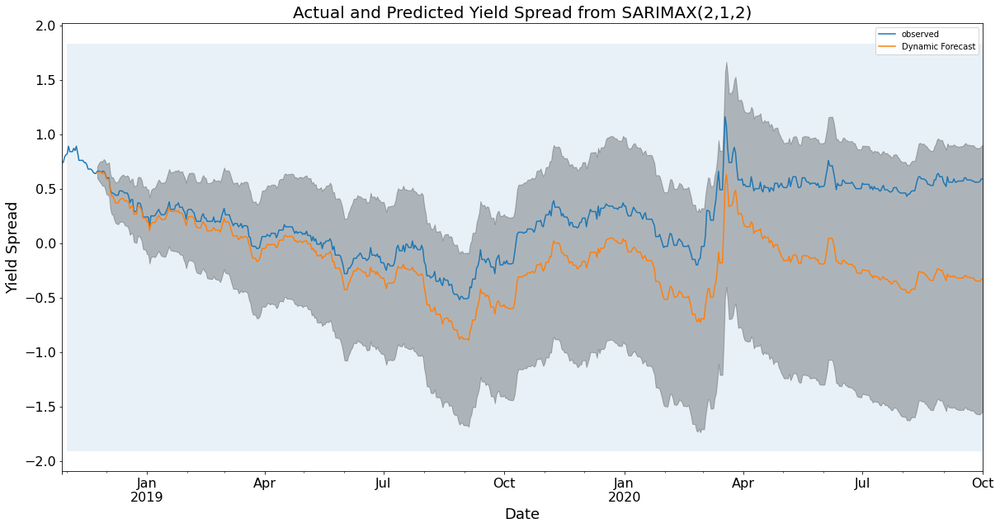

In [79]:
# plot the real and forecasted values of the yield spread 

ax = stat1['yieldsp']['2018-10-28':].plot(label='observed', figsize=(20, 10))
pred_dynamic.predicted_mean.plot(label='Dynamic Forecast', ax = ax, fontsize = 16)

ax.fill_between(pred_dynamic_ci.index,
                pred_dynamic_ci.iloc[:, 0],
                pred_dynamic_ci.iloc[:, 1], color='k', alpha=.25)

ax.fill_betweenx(ax.get_ylim(), pd.to_datetime('2018-11-01'), stat1['yieldsp'].index[-1],
                 alpha=.1, zorder=-1)

ax.set_xlabel('Date', fontsize = 18)
ax.set_ylabel('Yield Spread', fontsize = 18)
ax.set_title("Actual and Predicted Yield Spread from SARIMAX(2,1,2)", fontsize = 20)

plt.legend()
plt.show()

In [80]:
y_forecasted = pred_dynamic.predicted_mean
y_truth = stat1['yieldsp']['2018-11-24':]

# Compute the mean square error
rmse = sqrt(((y_forecasted - y_truth) ** 2).mean())
print('The Root Mean Squared Error of our forecasts is {}'.format(round(rmse, 4)))

The Root Mean Squared Error of our forecasts is 0.4744


In [81]:
exog_test.tail()

,ted,rec_ind,1yr-ffr,vix,termpr_diff,forward1yr_diff,infexp
Date,,,,,,,
2020-09-27,0.11,1.0,0.03,25.691582,0.0000,0.0000,2.519419
2020-09-28,0.11,1.0,0.03,26.190000,0.0000,0.0000,2.536514
2020-09-29,0.14,1.0,0.03,26.270000,-0.0041,-0.0044,2.555607
2020-09-30,0.13,1.0,0.03,26.370000,0.0107,0.0098,2.576751
2020-10-01,0.14,1.0,0.03,26.700000,0.0021,0.0000,2.600000


SARIMAX(2,1,2) predicts `rec_ind` 1.0 during September 2020 which is as expected. 

# Granger Causality Test  



The author has appliead the Granger Causality test to determine variables have causal relationship with $\Delta yieldsp$ .

Specifying the maximum number of lags specified as 40, the equation to test the null hypothesis is:

$$ \Delta yieldsp_t = \alpha_0 + \sum_{i=1}^{40} \alpha_i \ yieldsp_{t-i} + \sum_{j=1}^{40} \beta_j \ x_{t-j} $$

where $x_j$ refers to a stationary explanatory variable.

In [82]:
# granger causality for all variables in the train set
stat_train = train[['termpr_diff', 'forward1yr_diff', 'ted', 'vix', 'yieldsp', 'yieldsp_diff',
                    'rec_ind', 'infexp', '1yr-ffr']]

maxlag=40

def grangers_causality_matrix(data, variables, test = 'ssr_chi2test', verbose=False):

    dataset = pd.DataFrame(np.zeros((len(variables), len(variables))), columns=variables, index=variables)

    for c in dataset.columns:
        for r in dataset.index:
            test_result = grangercausalitytests(data[[r,c]], maxlag=maxlag, verbose=False)
            p_values = [round(test_result[i+1][0][test][1],4) for i in range(maxlag)]
            if verbose: print(f'Y = {r}, X = {c}, P Values = {p_values}')

            min_p_value = np.min(p_values)
            dataset.loc[r,c] = min_p_value

    dataset.columns = [var + '_x' for var in variables]

    dataset.index = [var + '_y' for var in variables]

    return dataset

granger_matrix = grangers_causality_matrix(stat_train, variables = stat_train.columns) 

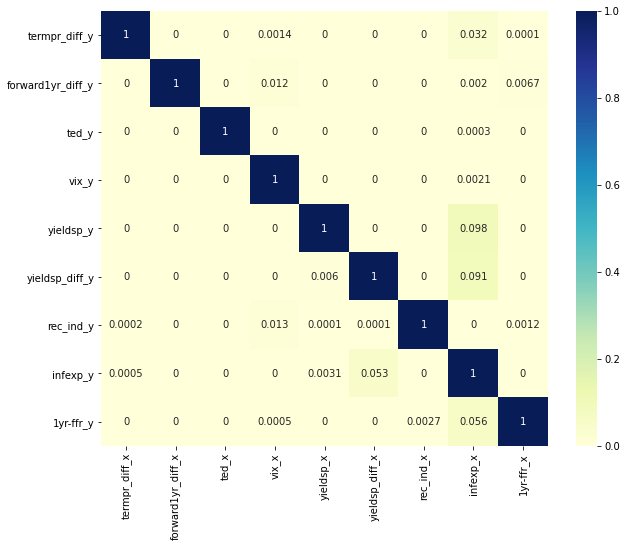

In [83]:
plt.figure(figsize = (10,8))
sn.heatmap(granger_matrix, annot=True, cmap="YlGnBu")

The row are the response ($y$) and the columns are the predictor series ($x$).

All the variables except infexp granger cause yieldsp as each of their p-vaalues = 0.00 < 0.05.

# Vector Autoregression (VAR)


### Determining the optimal lag order

The author has used the AIC criteria to find the optimal lag period for the VAR model.

In [84]:
# should use only the stationary variables for VAR
stat_train = train[['yieldsp_diff','termpr_diff', 'forward1yr_diff', 'ted', 'vix', 'rec_ind', '1yr-ffr']]

from statsmodels.tsa.api import VAR

AIC = {}
best_aic, best_order = np.inf, 0

for i in range(1,50):
    model = VAR(endog=stat_train.values)
    model_result = model.fit(maxlags=i)
    AIC[i] = model_result.aic
    
    if AIC[i] < best_aic:
        best_aic = AIC[i]
        best_order = i
        
print('Best Order', best_order, 'BEST AIC:', best_aic)

Best Order 45 BEST AIC: -40.86781412110635


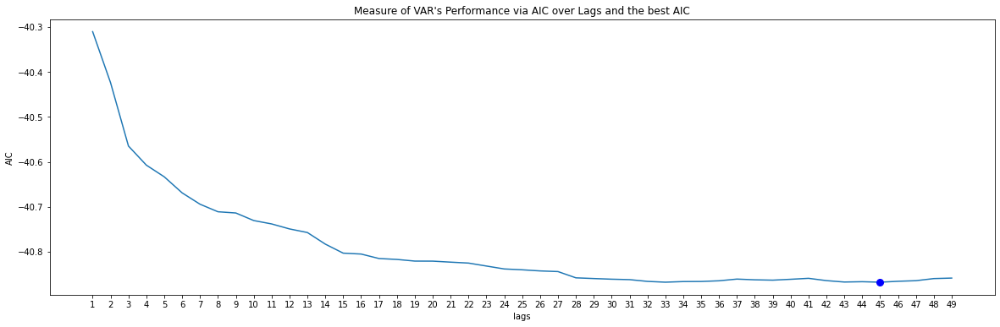

In [85]:
plt.figure(figsize=(20,6))
plt.plot(range(len(AIC)), list(AIC.values()))
plt.plot([best_order-1], [best_aic], marker='o', markersize=8, color="blue")
plt.xticks(range(len(AIC)), range(1,50))
plt.xlabel('lags'); plt.ylabel('AIC')
plt.title("Measure of VAR's Performance via AIC over Lags and the best AIC")
np.set_printoptions(False)

### Building a VAR(45) model

We have aggregated the variables used in VAR(45) as a (7 × 1) vector of series variables:

$$ Y_t = [\Delta yieldsp_t \ \ \Delta termpr_t \ \ \Delta forward1yr_t \ \ 1yrffr_t \ \ \text{rec_ind}_t \ \ ted_t \ \ vix_t]' $$

VAR(45) is a seemingly unrelated regression (SUR) model with $k = 7$ deterministic regressors and $l = 45$ lagged variables of the form:

$$ \Delta yieldsp_{t} = \alpha_1 + \sum_{i=1}^{7} \sum_{l=1}^{45} \beta_{i,l}^{\Delta yieldsp} \Delta yieldsp_{t-1} + \epsilon_{\Delta yieldsp_{t}} $$


$$ \Delta termpr_{t} = \alpha_2 + \sum_{i=1}^{7} \sum_{l=1}^{45} \beta_{i,l}^{\Delta termpr} \Delta yieldsp_{t-1} + \epsilon_{\Delta termpr_{t}} $$


$$ \Delta forward1yr_{t} = \alpha_3 + \sum_{i=1}^{7} \sum_{l=1}^{45} \beta_{i,l}^{\Delta forward1yr} \Delta yieldsp_{t-1} + \epsilon_{\Delta forward1yr_{t}} $$


$$ \text{1yr-frr}_{t} = \alpha_4 + \sum_{i=1}^{7} \sum_{l=1}^{45} \beta_{i,l}^{\text{1yr-frr}} \Delta yieldsp_{t-1} + \epsilon_{\text{1yr-frr}_t} $$


$$ \text{rec_ind}_{t} = \alpha_5 + \sum_{i=1}^{7} \sum_{l=1}^{45} \beta_{i,l}^{\text{rec_ind}} \Delta yieldsp_{t-1} + \epsilon_{\text{rec_ind}_t} $$

$$ ted_{t} = \alpha_6 + \sum_{i=1}^{7} \sum_{l=1}^{45} \beta_{i,l}^{ted} \Delta yieldsp_{t-1} + \epsilon_{ted_{t}} $$

$$ vix_{t} = \alpha_7 + \sum_{i=1}^{7} \sum_{l=1}^{45} \beta_{i,l}^{vix} \Delta yieldsp_{t-1} + \epsilon_{vix_{t}} $$

where $ \epsilon_{t} = [ \epsilon_{{\Delta yieldsp}_{t}} \ \ \epsilon_{{\Delta termpr}_{t}} \ \ \epsilon_{{\Delta forward1yr}_{t}} \ \ \epsilon_{{1yrffr}_{t}} \ \ \epsilon_{{\text{rec_ind}}_{t}} \ \ \epsilon_{{ted}_{t}} \ \ \epsilon_{{vix}_{t}}]' $ is a white noise process of "innovations".

$ \epsilon_{t} = [ \epsilon_{{\Delta yieldsp}_{t}} \ \ \epsilon_{{\Delta termpr}_{t}} \ \ \epsilon_{{\Delta forward1yr}_{t}} \ \ \epsilon_{{1yrffr}_{t}} \ \ \epsilon_{{\text{rec_ind}}_{t}} \ \ \epsilon_{{ted}_{t}} \ \ \epsilon_{{vix}_{t}}]' $

In [86]:
# fit the VAR model 
mod = VAR(stat_train)
res = mod.fit(best_order) 
res.summary() 

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.



  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Fri, 25, Dec, 2020
Time:                     17:01:54
--------------------------------------------------------------------
No. of Equations:         7.00000    BIC:                   -39.3540
Nobs:                     10624.0    HQIC:                  -40.3569
Log likelihood:           113778.    FPE:                1.78397e-18
AIC:                     -40.8678    Det(Omega_mle):     1.45306e-18
--------------------------------------------------------------------
Results for equation yieldsp_diff
                         coefficient       std. error           t-stat            prob
--------------------------------------------------------------------------------------
const                       0.003419         0.001659            2.061           0.039
L1.yieldsp_diff             0.089249         0.022530            3.961           0.000
L1.termpr_diff             -0

### Durbin-Watson Statistic

The author claims that the [durbin-watson statistic](https://en.wikipedia.org/wiki/Durbin%E2%80%93Watson_statistic) for all the variables in the VAR system is 2, implying that they are serially uncorrelated.

In [87]:
from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(res.resid)

for col, val in zip(stat_train.columns, out):
    print((col), ':', round(val, 2))

yieldsp_diff : 2.0
termpr_diff : 2.0
forward1yr_diff : 2.0
ted : 2.0
vix : 2.0
rec_ind : 2.0
1yr-ffr : 2.0


### Forecasting using the VAR model

In [88]:
lag_order = res.k_ar

train, test = np.split(stat1, [int(.95 *len(stat1))])

stat_test = test[['yieldsp_diff','termpr_diff', 'forward1yr_diff', 'ted', 'vix', 'rec_ind', '1yr-ffr']]

input_data = stat_test.values[-lag_order:]

pred = res.forecast(y=input_data, steps = len(test))
pred1 = pd.DataFrame(pred, index=stat_test.index, columns= stat_test.columns + '_pred')
pred1.head()

,yieldsp_diff_pred,termpr_diff_pred,forward1yr_diff_pred,ted_pred,vix_pred,rec_ind_pred,1yr-ffr_pred
Date,,,,,,,
2019-03-20,0.018153,0.004315,0.006912,0.141936,26.880096,0.993790,0.079835
2019-03-21,0.001601,0.001717,-0.001114,0.145909,26.685031,0.985281,0.089191
2019-03-22,0.001071,-0.003120,-0.002581,0.143991,26.758351,0.974677,0.083892
2019-03-23,0.017312,0.002926,0.001307,0.155681,26.688817,0.971607,0.083033
2019-03-24,0.016738,0.003896,0.003525,0.163486,26.374960,0.963143,0.110345


In [89]:
merge0 = pd.merge(test['yieldsp'], pred1['yieldsp_diff_pred'].to_frame(), how='inner', 
                  left_index=True, right_index=True)
merge0.head()

,yieldsp,yieldsp_diff_pred
Date,,
2019-03-20,0.06,0.018153
2019-03-21,0.05,0.001601
2019-03-22,-0.02,0.001071
2019-03-23,-0.03,0.017312
2019-03-24,-0.03,0.016738


In [90]:
def invert_diff(history, yhat, interval=1):
    return yhat + history[-interval]

invert0 = invert_diff(merge0['yieldsp'], merge0['yieldsp_diff_pred'], 1).to_frame()
invert0.rename(columns={'yieldsp_diff_pred':'invert_yieldsp_var'}, inplace=True)
merge_invert0 = pd.merge(merge0, invert0, how='inner', left_index=True, 
                         right_index=True).drop(['yieldsp_diff_pred'], axis = 1)
merge_invert0.tail()

,yieldsp,invert_yieldsp_var
Date,,
2020-09-27,0.56,0.589442
2020-09-28,0.56,0.589444
2020-09-29,0.57,0.589446
2020-09-30,0.59,0.589448
2020-10-01,0.59,0.589450


In [91]:
error = mean_squared_error(merge_invert0['yieldsp'], merge_invert0['invert_yieldsp_var'])
rmse = sqrt(error)
print('RMSE: %.5f' % rmse)

RMSE: 0.50267


# IRF and FEVD

The author has examined the properties of VAR by doing structural analyses using impulse responses and forecast error variance decomposition.

## Impulse Response Function (IRF)

IRFs trace out the time path of the effects of an exogenous shock $\epsilon_t$ to one (or more) of the endogenous variables on some or all of the other variables in a VAR system given that no future innovations are present in the system.

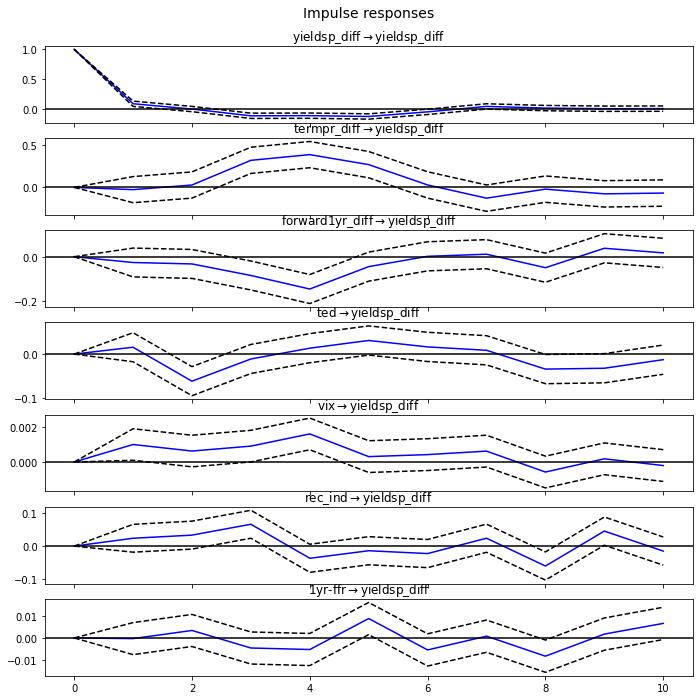

In [92]:
irf1 = res.irf(10)
irf1.plot(response ='yieldsp_diff');

The impulse response of shocks on $\Delta yieldsp$ decays to 0 by the tenth
period, signifying that one-time innovations don’t have long-term ramifications on the paths of $\Delta yieldsp$.

## Forecast Error Variance Decomposition (FEVD)
Another way to characterize the dynamics associated with the VAR is by computing the FEVD from the VAR model.

In [93]:
fevd = res.fevd(5)
fevd.summary()

FEVD for yieldsp_diff
     yieldsp_diff  termpr_diff  forward1yr_diff       ted       vix   rec_ind   1yr-ffr
0        1.000000     0.000000         0.000000  0.000000  0.000000  0.000000  0.000000
1        0.998289     0.000920         0.000108  0.000105  0.000460  0.000118  0.000001
2        0.996227     0.001186         0.000123  0.001400  0.000642  0.000341  0.000082
3        0.992569     0.002648         0.000872  0.001410  0.001018  0.001257  0.000225
4        0.988423     0.002771         0.003203  0.001509  0.002160  0.001520  0.000414

FEVD for termpr_diff
     yieldsp_diff  termpr_diff  forward1yr_diff       ted       vix   rec_ind   1yr-ffr
0        0.601565     0.398435         0.000000  0.000000  0.000000  0.000000  0.000000
1        0.612890     0.386126         0.000767  0.000000  0.000044  0.000171  0.000002
2        0.613462     0.384468         0.000915  0.000329  0.000417  0.000191  0.000218
3        0.613674     0.382892         0.000925  0.000623  0.000595  0.00107

# Multilayer Perceptron (MLP)

The author has made various MLP network by varying the number of neurons (1,3 and 5) with the lag period = 3. The author has also run every experiment 8 times.

 So, i have set up a generic function to model all the MLPs. 

`Can defintely improve here; do for a bunch of lag periods and neurons, this is a very shallow network, can improve significantly using deeper networks.`

In [94]:
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')

def timeseries_to_supervised(data, lag=1):
    df = DataFrame(data)
    columns = [df.shift(i) for i in range(1, lag+1)]
    columns.append(df)
    df = pd.concat(columns, axis=1)
    df = df.drop(0)
    return df

def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)

def inverse_difference(history, yhat, interval=1):
    return yhat + history[-interval]

def scale(train, test):
    # fit scaler
    scaler = MinMaxScaler(feature_range=(-1, 1))
    scaler = scaler.fit(train)
    
    # transform train
    train = train.reshape(train.shape[0], train.shape[1])
    train_scaled = scaler.transform(train)
    
    # transform test
    test = test.reshape(test.shape[0], test.shape[1])
    test_scaled = scaler.transform(test)
    return scaler, train_scaled, test_scaled

def invert_scale(scaler, X, yhat):
    new_row = [x for x in X] + [yhat]
    array = np.array(new_row)
    array = array.reshape(1, len(array))
    inverted = scaler.inverse_transform(array)
    return inverted[0, -1]

def evaluate(model, raw_data, scaled_dataset, scaler, offset, batch_size):
    
    X, y = scaled_dataset[:,0:-1], scaled_dataset[:,-1]
    output = model.predict(X, batch_size=batch_size)
    
    predictions = list()
    for i in range(len(output)):
        yhat = output[i,0]
        yhat = invert_scale(scaler, X[i], yhat)
        yhat = yhat + raw_data[i]
        
        predictions.append(yhat)
        
    #evaluation metric
    rmse = sqrt(mean_squared_error(raw_data[1:], predictions))
    return rmse

# fit an MLP network based on the parameters
def fit(train, test, raw, scaler, batch_size, nb_epoch, neurons):
    X, y = train[:, 0:-1], train[:, -1]
    
    #building the model architecture
    model = Sequential()
    model.add(Dense(neurons, activation='relu', input_dim=X.shape[1]))
    model.add(Dense(1))
    model.compile(loss='mean_squared_error', optimizer='adam')
    
    # fit model
    train_rmse, test_rmse = list(), list()
    for i in range(nb_epoch):
        model.fit(X, y, epochs=1, batch_size=batch_size, verbose=0, shuffle=False)
        
        raw_train = raw[-(len(train)+len(test)+1):-len(test)]
        train_rmse.append(evaluate(model, raw_train, train, scaler, 0, batch_size))
        
        raw_test = raw[-(len(test)+1):]
        test_rmse.append(evaluate(model, raw_test, test, scaler, 0, batch_size))
    history = DataFrame()
    history['train'], history['test'] = train_rmse, test_rmse
    return history

def fit_model(train, batch_size, nb_epoch, neurons):
    X, y = train[:, 0:-1], train[:, -1]
    model = Sequential()
    model.add(Dense(neurons, activation='relu', input_dim=X.shape[1]))
    model.add(Dense(1))
    model.compile(loss='mean_squared_error', optimizer='adam')
    model.fit(X, y, epochs=nb_epoch, batch_size=batch_size, verbose=1, shuffle=False)
    return model

### Building, training and evaluating the various MLP network

Epoch 1/10
586/586 [==============================] - 1s 829us/step - loss: 0.0165
Epoch 2/10
586/586 [==============================] - 1s 857us/step - loss: 0.0134
Epoch 3/10
586/586 [==============================] - 1s 860us/step - loss: 0.0127
Epoch 4/10
586/586 [==============================] - 0s 820us/step - loss: 0.0123
Epoch 5/10
586/586 [==============================] - 1s 854us/step - loss: 0.0122
Epoch 6/10
586/586 [==============================] - 0s 832us/step - loss: 0.0121
Epoch 7/10
586/586 [==============================] - 0s 811us/step - loss: 0.0121
Epoch 8/10
586/586 [==============================] - 0s 813us/step - loss: 0.0120
Epoch 9/10
586/586 [==============================] - 0s 817us/step - loss: 0.0120
Epoch 10/10
586/586 [==============================] - 0s 814us/step - loss: 0.0120
1) Test RMSE: 0.056
Epoch 1/10
586/586 [==============================] - 1s 782us/step - loss: 0.1098
Epoch 2/10
586/586 [==============================] - 0s 763us/ste

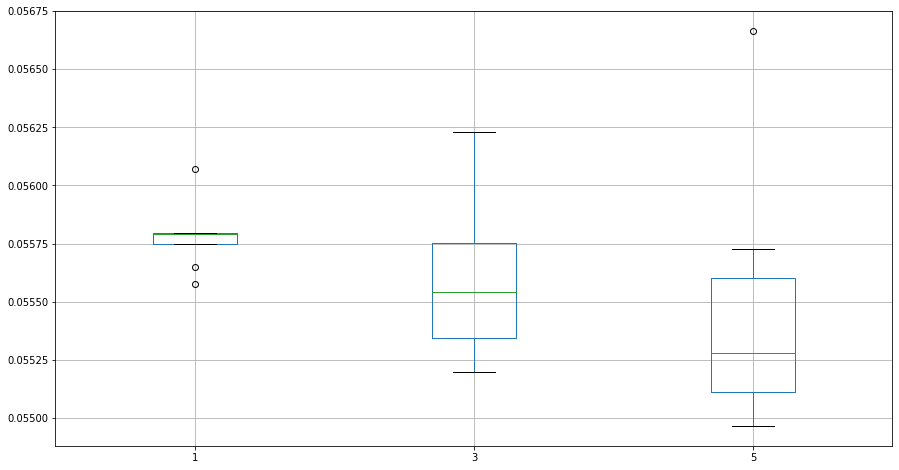

In [95]:
# building, training and evaluating the various MLP networks

def experiment(repeats, series, epochs, lag, neurons):
    
    raw_values = series.values
    diff_values = difference(raw_values, 1)
    
    supervised = timeseries_to_supervised(diff_values, lag)
    supervised_values = supervised.values[lag:,:]
    
    train, test = supervised_values[0:-365], supervised_values[-365:]
    scaler, train_scaled, test_scaled = scale(train, test)
    
    error_scores = list()
    for r in range(repeats):
        
        batch_size = 16
        model = fit_model(train_scaled, batch_size, epochs, neurons)
        
        test_reshaped = test_scaled[:,0:-1]
        output = model.predict(test_reshaped, batch_size=batch_size)
        predictions = list()
        for i in range(len(output)):
            yhat = output[i,0]
            X = test_scaled[i, 0:-1]
            yhat = invert_scale(scaler, X, yhat)
            yhat = inverse_difference(raw_values, yhat, len(test_scaled)+1-i)
            
            predictions.append(yhat)
            
        rmse = sqrt(mean_squared_error(raw_values[-365:], predictions))
        
        print('%d) Test RMSE: %.3f' % (r+1, rmse))
        error_scores.append(rmse)
    return error_scores

series = yieldsp

#config variables for the various setups 0
repeats = 8
results = DataFrame()
epochs = 10
neurons = [1, 3, 5]

for n in neurons:
    results[str(n)] = experiment(repeats, series, epochs, n, n)
    
print(results.describe())

results.boxplot()
pyplot.savefig('boxplot_neurons_lag.png')

### Checking Overfitting

The author plots the test and train RMSE for each of the 10 runs.

0) TrainRMSE=0.076739, TestRMSE=0.055401
1) TrainRMSE=0.076642, TestRMSE=0.055215
2) TrainRMSE=0.076867, TestRMSE=0.055796
3) TrainRMSE=0.076862, TestRMSE=0.055795
4) TrainRMSE=0.076537, TestRMSE=0.055378
5) TrainRMSE=0.076852, TestRMSE=0.055792
6) TrainRMSE=0.076735, TestRMSE=0.055380
7) TrainRMSE=0.076911, TestRMSE=0.055492
8) TrainRMSE=0.076516, TestRMSE=0.055340
9) TrainRMSE=0.076770, TestRMSE=0.055567


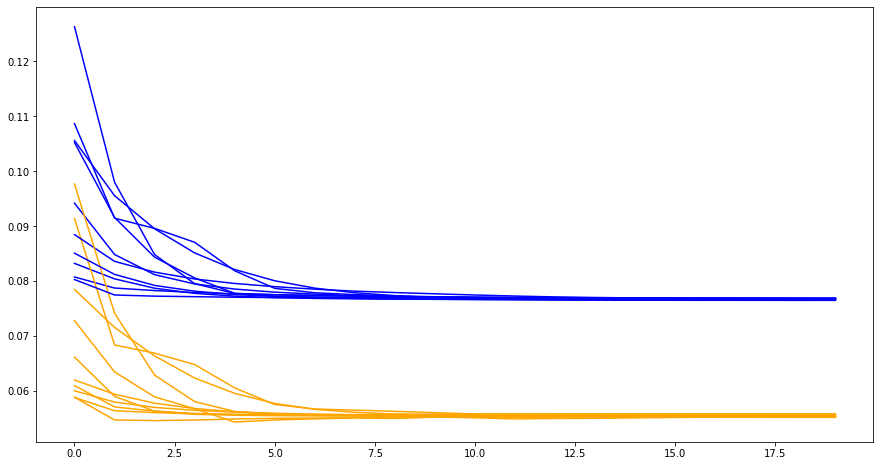

In [96]:
# run diagnostic experiments
def run():
	# config
	repeats = 10
	n_batch = 16
	n_epochs = 20
	n_neurons = 2
	n_lag = 3
    
	# load dataset
	series = yieldsp
    
	# transform data to be stationary
	raw_values = series.values
	diff_values = difference(raw_values, 1)
    
	# transform data to be supervised learning
	supervised = timeseries_to_supervised(diff_values, n_lag)
	supervised_values = supervised.values[n_lag:,:]
    
	# split data into train and test-sets
	train, test = supervised_values[0:-365], supervised_values[-365:]
    
	# transform the scale of the data
	scaler, train_scaled, test_scaled = scale(train, test)
    
	# fit and evaluate model
	train_trimmed = train_scaled[2:, :]
    
	# run diagnostic tests
	for i in range(repeats):
		history = fit(train_trimmed, test_scaled, raw_values, scaler, n_batch, n_epochs, n_neurons)
		pyplot.plot(history['train'], color='blue')
		pyplot.plot(history['test'], color='orange')
        #pyplot.legend(["Train RMSE", "Test RMSE"]) 
        #pyplot.title('Train and Test RMSE After Each Training Epoch for', repeats ,'Experimental Runs.')
		print('%d) TrainRMSE=%f, TestRMSE=%f' % (i, history['train'].iloc[-1], history['test'].iloc[-1]))
	pyplot.savefig('diagnostic_neurons_lag.png')
    
# entry point
run()    

# [Long Short Term Memory](https://colah.github.io/posts/2015-08-Understanding-LSTMs/) (LSTMs)


## Vanilla LSTMs

The author has constructed a multi-layered LSTM network to forecast the test set values of the yield spread, given the history of observations in the training set. 

#### Pre-processing and feature engineering

In [120]:
dataset = yieldsp['yieldsp'].values 
dataset = dataset.astype('float32') 
dataset = np.reshape(dataset, (-1, 1)) 

In [121]:
dataset.shape

(9741, 1)

#### Feature Normalization

As LSTMs are sensitive to the scale of the input data, particularly when we invoke the sigmoid or the hyperbolic tangent activation functions, we need to normalized to the range (0,1).

In [122]:
scaler = MinMaxScaler(feature_range=(0, 1)) 
dataset = scaler.fit_transform(dataset)

In [123]:
train, test = np.split(yieldsp, [int(.95 *len(yieldsp))])
train.shape

(9253, 1)

### Building the LSTM Model 


I have created a class to easily model LSTMs. 

[Inspiration](https://towardsdatascience.com/energy-consumption-time-series-forecasting-with-python-and-lstm-deep-learning-model-7952e2f9a796)

In [124]:
from keras.models import Sequential
from keras.layers import LSTM, Dense

class DeepModelTS():
    """
    A class to create a deep time series model
    """
    def __init__(
        self, 
        data: pd.DataFrame, 
        Y_var: str,
        lag: int,
        LSTM_layer_depth: int, 
        epochs=10, 
        batch_size=256,
        train_test_split=0,
        patience = 5
    ):

        self.data = data 
        self.Y_var = Y_var 
        self.lag = lag 
        self.LSTM_layer_depth = LSTM_layer_depth
        self.batch_size = batch_size
        self.epochs = epochs
        self.patience = patience
        self.train_test_split = train_test_split

    @staticmethod
    def create_X_Y(ts: list, lag: int) -> tuple:
        """
        A method to create X and Y matrix from a time series list for the training of 
        deep learning models 
        """
        X, Y = [], []

        if len(ts) - lag <= 0:
            X.append(ts)
        else:
            for i in range(len(ts) - lag):
                Y.append(ts[i + lag])
                X.append(ts[i:(i + lag)])

        X, Y = np.array(X), np.array(Y)

        # Reshaping the X array to an LSTM input shape 
        X = np.reshape(X, (X.shape[0], X.shape[1], 1))

        return X, Y         

    def create_data_for_NN(self,use_last_n=None):
        """
        A method to create data for the LSTM model
        """
        # Extracting the dependent variable we want to model/forecast
        y = self.data[self.Y_var].tolist()

        # Subseting the time series if needed
        if use_last_n is not None:
            y = y[-use_last_n:]

        # The X matrix will hold the lags of Y 
        X, Y = self.create_X_Y(y, self.lag)

        # Creating training and test sets 
        X_train = X
        X_test = []

        Y_train = Y
        Y_test = []

        if self.train_test_split > 0:
            index = round(len(X) * self.train_test_split)
            X_train = X[:(len(X) - index)]
            X_test = X[-index:]     
            
            Y_train = Y[:(len(X) - index)]
            Y_test = Y[-index:]

        return X_train, X_test, Y_train, Y_test

    def LSTModel(self):
        """
        A method to fit the LSTM model 
        """
        # Getting the data 
        X_train, X_test, Y_train, Y_test = self.create_data_for_NN()

        # Defining the model
        model = Sequential()
        model.add(LSTM(self.LSTM_layer_depth, activation='relu', input_shape=(self.lag, 1)))
        model.add(Dense(1))
        model.compile(optimizer='adam', loss='mse')

        # Fitting the model 
        model.fit(X_train, Y_train, 
                  self.batch_size,
                  self.epochs, 
                  validation_data=(X_test, Y_test), 
                  callbacks = [EarlyStopping(monitor='val_loss', patience= self.patience)], 
                  verbose=1, shuffle=False)

        # Saving the model to the class 
        self.model = model

        return model

    def predict(self) -> list:
        """
        A method to predict using the test data used in creating the class
        """
        yhat = []

        if(self.train_test_split > 0):
        
            # Getting the last n time series 
            _, X_test, _, _ = self.create_data_for_NN()        

            # Making the prediction list 
            yhat = [y[0] for y in self.model.predict(X_test)]

        return yhat

    def predict_n_ahead(self, n_ahead: int):
        """
        A method to predict n time steps ahead
        """    
        X, _, _, _ = self.create_data_for_NN(use_last_n=self.lag)        

        # Making the prediction list 
        yhat = []

        for _ in range(n_ahead):
            # Making the prediction
            fc = self.model.predict(X)
            yhat.append(fc)

            # Creating a new input matrix for forecasting
            X = np.append(X, fc)

            # Ommiting the first variable
            X = np.delete(X, 0)

            # Reshaping for the next iteration
            X = np.reshape(X, (1, len(X), 1))


* the model architecture consists of only 1 LSTM layer with 50 neurons
* [Dropout](https://en.wikipedia.org/wiki/Dilution_(neural_networks)) of 0.2 is used; which randomly ignores 20% of the neurons in each training epoch, helping regularize and reduce overfitting.
* the [MSE loss](https://en.wikipedia.org/wiki/Mean_squared_error) function is used
* the [ADAM optimizer](https://arxiv.org/abs/1412.6980) is used
* the model has been trained for 200 epochs.    

In [125]:
# Training the model with more lag periods increases the training time:
deep_learner = DeepModelTS(data = train, Y_var = 'yieldsp',  lag = 50, 
                           LSTM_layer_depth = 50,  epochs = 1000 ,batch_size = 64,
                           train_test_split = 0.05, patience = 200)

model = deep_learner.LSTModel()

Epoch 1/1000
137/137 [==============================] - 5s 29ms/step - loss: 1.7398 - val_loss: 0.0336
Epoch 2/1000
137/137 [==============================] - 4s 27ms/step - loss: 0.1254 - val_loss: 0.0096
Epoch 3/1000
137/137 [==============================] - 4s 27ms/step - loss: 0.0340 - val_loss: 0.0046
Epoch 4/1000
137/137 [==============================] - 4s 28ms/step - loss: 0.0260 - val_loss: 0.0038
Epoch 5/1000
137/137 [==============================] - 4s 27ms/step - loss: 0.0234 - val_loss: 0.0039
Epoch 6/1000
137/137 [==============================] - 4s 27ms/step - loss: 0.0218 - val_loss: 0.0034
Epoch 7/1000
137/137 [==============================] - 4s 28ms/step - loss: 0.0205 - val_loss: 0.0058
Epoch 8/1000
137/137 [==============================] - 4s 27ms/step - loss: 0.0207 - val_loss: 0.0042
Epoch 9/1000
137/137 [==============================] - 4s 27ms/step - loss: 0.0202 - val_loss: 0.0033
Epoch 10/1000
137/137 [==============================] - 4s 27ms/step - l

### Actual vs Predicted Yield Spread using vanilla LSTMs

In [126]:
lag = 50

ts = train['yieldsp'].tail(lag ).values.tolist()

X, _ = deep_learner.create_X_Y(ts, lag=lag )

yhat = model.predict(X)

# to see how our model performs out of sample.
yhat = deep_learner.predict()

fc = train.tail(len(yhat)).copy()
fc['forecast'] = yhat
fc.head()

,yieldsp,forecast
Date,,
2017-03-03,1.78,1.836459
2017-03-06,1.75,1.794359
2017-03-07,1.76,1.765843
2017-03-08,1.84,1.780476
2017-03-09,1.87,1.867213


In [127]:
fig_lstm = fc.iplot(asFigure=True, kind='scatter', xTitle='Date', yTitle='Yield Spread')

fig_lstm.update_layout(
    title={
        'text': "Actual and Predicted Yield Spread from vanilla LSTM",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig_lstm.show()

In [128]:
error = mean_squared_error(fc['yieldsp'], fc['forecast'])
rmse = sqrt(error)
print('Train RMSE from vanilla LSTM: %.5f' % rmse)

Train RMSE from LSTM: 0.04901


## Stacked LSTMs with Memory Between Batches

We can gain finer control over when the internal state of the LSTM network is cleared in Keras by making the LSTM layer [“stateful”](https://machinelearningmastery.com/understanding-stateful-lstm-recurrent-neural-networks-python-keras/). This means that it can build state over the entire training sequence and even maintain that state if needed to make predictions.

In [129]:
def create_dataset(dataset, look_back=1):
    X, Y = [], []
    for i in range(len(dataset)-look_back-1):
        a = dataset[i:(i+look_back), 0]
        X.append(a)
        Y.append(dataset[i + look_back, 0])
    return np.array(X), np.array(Y)

In [130]:
np.random.seed(7)

dataframe = yieldsp
dataset = dataframe.values
dataset = dataset.astype('float32')

# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset = scaler.fit_transform(dataset)

'''
    Keras requires that In a stateful network, you should only pass inputs
    with a number of samples that can be divided by the batch size.

    Thus, we need to hard code the test-train split, i have done the split in a manner
    that we have 10:1 ratio between train and test sizes.
'''
train, test = dataset[0:8851,:], dataset[8801:-9,:]

# reshape into X=t and Y=t+1
look_back = 50
trainX, trainY = create_dataset(train, look_back)
testX, testY = create_dataset(test, look_back)

# reshape input to be [samples, time steps, features]
trainX = np.reshape(trainX, (trainX.shape[0], trainX.shape[1], 1))
testX = np.reshape(testX, (testX.shape[0], testX.shape[1], 1))

In [131]:
print(len(trainX))
print(len(testX))

8800
880


In [132]:
# create and fit the stateful LSTM network

batch_size = 110
model = Sequential()
model.add(LSTM(4, batch_input_shape=(batch_size, look_back, 1), stateful=True, return_sequences=True))
model.add(LSTM(4, batch_input_shape=(batch_size, look_back, 1), stateful=True))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')

model.fit(trainX, trainY, epochs=100, batch_size=batch_size, verbose=1, shuffle=False,
          callbacks = [EarlyStopping(monitor='loss', patience= 20)], )
model.reset_states()

trainPredict = model.predict(trainX, batch_size=batch_size)

model.reset_states()
testPredict = model.predict(testX, batch_size=batch_size)

trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])

Epoch 1/100
80/80 [==============================] - 4s 21ms/step - loss: 0.0695
Epoch 2/100
80/80 [==============================] - 2s 21ms/step - loss: 0.0043
Epoch 3/100
80/80 [==============================] - 2s 22ms/step - loss: 0.0021
Epoch 4/100
80/80 [==============================] - 2s 21ms/step - loss: 0.0017
Epoch 5/100
80/80 [==============================] - 2s 22ms/step - loss: 0.0017
Epoch 6/100
80/80 [==============================] - 2s 22ms/step - loss: 0.0017
Epoch 7/100
80/80 [==============================] - 2s 22ms/step - loss: 0.0016
Epoch 8/100
80/80 [==============================] - 2s 22ms/step - loss: 0.0016
Epoch 9/100
80/80 [==============================] - 2s 22ms/step - loss: 0.0016
Epoch 10/100
80/80 [==============================] - 2s 22ms/step - loss: 0.0016
Epoch 11/100
80/80 [==============================] - 2s 22ms/step - loss: 0.0016
Epoch 12/100
80/80 [==============================] - 2s 22ms/step - loss: 0.0015
Epoch 13/100
80/80 [=====

### Results from using Stateful stacked LSTMs

In [133]:
# calculate root mean squared error
trainScore = math.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train Score: %.5f RMSE' % (trainScore))
testScore = math.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test Score: %.5f RMSE' % (testScore))

Train Score: 0.10483 RMSE
Test Score: 0.06733 RMSE


In [134]:
# shift train predictions for plotting
trainPredictPlot = np.empty_like(dataset)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict

# shift test predictions for plotting
testPredictPlot = np.empty_like(dataset)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(trainPredict) + look_back:9730, :] = testPredict

# combine the predicted and actual data
train_pred = pd.DataFrame(trainPredictPlot, columns = ['train_pred'])
test_pred = pd.DataFrame(testPredictPlot, columns = ['test_pred'])
pred = pd.merge(train_pred, test_pred, on = test_pred.index)
pred1 = pred[['train_pred', 'test_pred']]
merged = pd.merge(yieldsp, pred1, on = yieldsp.index).rename(columns= {'key_0': 'Date'}).set_index('Date')

fig_lstm = merged.iplot(asFigure=True, kind='scatter', xTitle='Date', yTitle='Yield Spread')
fig_lstm

## LSTM using  multivariate data

### Building a multivariate LSTM model

In [135]:
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
	n_vars = 1 if type(data) is list else data.shape[1]
	df = DataFrame(data)
	cols, names = list(), list()
 
	for i in range(n_in, 0, -1):
		cols.append(df.shift(i))
		names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    
	for i in range(0, n_out):
		cols.append(df.shift(-i))
		if i == 0:
			names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
		else:
			names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
    
	agg = pd.concat(cols, axis=1)
	agg.columns = names
    
	if dropnan:
		agg.dropna(inplace=True)
	return agg
 
values = yield_d.values

encoder = LabelEncoder()
values[:,4] = encoder.fit_transform(values[:,4])
values = values.astype('float32')

scaler = MinMaxScaler(feature_range=(0, 1))
scaled = scaler.fit_transform(values)

reframed = series_to_supervised(scaled, 1, 1)
reframed.drop(reframed.columns[[ 10, 11, 12,13, 14, 15, 16, 17]], axis=1, inplace=True)
reframed.head()

,var1(t-1),var2(t-1),var3(t-1),var4(t-1),var5(t-1),var6(t-1),var7(t-1),var8(t-1),var9(t-1),var1(t)
1,0.219917,0.158129,0.867505,0.0,0.257310,0.713155,0.043947,0.774314,0.117786,0.219917
2,0.219917,0.158129,0.867505,0.0,0.257310,0.713155,0.044159,0.778583,0.117786,0.217842
3,0.217842,0.146993,0.872790,0.0,0.318713,0.719705,0.044351,0.782474,0.129367,0.226141
4,0.226141,0.155902,0.871609,0.0,0.333333,0.720388,0.044525,0.785997,0.141925,0.238589
5,0.238589,0.167038,0.870737,0.0,0.350877,0.723854,0.044680,0.789162,0.152775,0.244813


In [136]:
values = reframed.values
n_train_hours = int(.95 *len(reframed))
train = values[:n_train_hours, :]
test = values[n_train_hours:, :]

train_X, train_y = train[:, :-1], train[:, -1]
test_X, test_y = test[:, :-1], test[:, -1]

train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))
print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

(10669, 1, 9) (10669,) (562, 1, 9) (562,)


In [137]:
model = Sequential()
model.add(LSTM(25, input_shape=(train_X.shape[1], train_X.shape[2])))
model.add(Dense(1))
model.compile(loss='mae', optimizer='RMSprop')

# fit network
history = model.fit(train_X, train_y, epochs=500, batch_size=50, validation_data=(test_X, test_y), 
                    # callbacks = [EarlyStopping(monitor='val_loss', patience= 100)],
                    verbose=1, shuffle=False)

Epoch 1/500
214/214 [==============================] - 3s 4ms/step - loss: 0.2302 - val_loss: 0.1255
Epoch 2/500
214/214 [==============================] - 0s 2ms/step - loss: 0.0965 - val_loss: 0.0909
Epoch 3/500
214/214 [==============================] - 0s 2ms/step - loss: 0.0488 - val_loss: 0.0848
Epoch 4/500
214/214 [==============================] - 0s 2ms/step - loss: 0.0315 - val_loss: 0.0656
Epoch 5/500
214/214 [==============================] - 0s 2ms/step - loss: 0.0218 - val_loss: 0.0514
Epoch 6/500
214/214 [==============================] - 1s 2ms/step - loss: 0.0184 - val_loss: 0.0390
Epoch 7/500
214/214 [==============================] - 1s 3ms/step - loss: 0.0166 - val_loss: 0.0310
Epoch 8/500
214/214 [==============================] - 1s 2ms/step - loss: 0.0154 - val_loss: 0.0265
Epoch 9/500
214/214 [==============================] - 0s 2ms/step - loss: 0.0140 - val_loss: 0.0223
Epoch 10/500
214/214 [==============================] - 0s 2ms/step - loss: 0.0130 - val_lo

### Plotting the test and validation losses 

In [138]:
mod_loss1 = pd.DataFrame(history.history, columns=['loss', 'val_loss'])

In [139]:
fig_loss1 = mod_loss1.iplot(asFigure=True, kind='scatter', xTitle='Epochs', yTitle='Loss')

fig_loss1.update_layout(
    title={
        'text': 'Training and Validation loss of the multivariate LSTM model ',
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig_loss1.show()

### Forecasting using the multivariate LSTM model

In [140]:
# forecast for the entire dataset
yhat = model.predict(test_X)
test_X = test_X.reshape((test_X.shape[0], test_X.shape[2]))

# invert scaling for forecast
inv_yhat = concatenate((yhat, test_X[:, 1:]), axis=1)
inv_yhat = scaler.inverse_transform(inv_yhat)
inv_yhat = inv_yhat[:,0]

# invert scaling for actual
test_y = test_y.reshape((len(test_y), 1))
inv_y = concatenate((test_y, test_X[:, 1:]), axis=1)
inv_y = scaler.inverse_transform(inv_y)
inv_y = inv_y[:,0]

# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
print('Test RMSE: %.5f' % rmse)

Test RMSE: 0.08434


In [141]:
train_data, test_data = np.split(yield_d, [int(.95 *len(yield_d))])

invert = pd.DataFrame(inv_y, columns = ['yieldsp_lstm'])
yhat_lstm = pd.DataFrame(inv_yhat, columns = ['inv_yhat_lstm'])
lstm = pd.merge(invert, yhat_lstm, 
                on = test_data.index).rename(columns= {'key_0': 'Date'}).set_index('Date')

In [142]:
fig_lstm_d = lstm.iplot(asFigure=True, kind='scatter', xTitle='Date', yTitle='Yield Spread')
fig_lstm_d.update_layout(
    title={
        'text': 'Actual and Forecasted Yield Spread using Multivariate LSTM model',
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig_lstm_d.show()

# Conclusion

| Model      | RMSE |
| :------------------:|  :------------------: |
| ARIMA(1,0,3)  | 0.05110   |
| Differenced ARIMA(3,1,3) | 0.05147 |
| SARIMAX(2,1,2) | 0.4744 |
| VAR(45) | 0.50267 | 
| MLP | 0.055215 | 
| Stateful stacked LSTM | 0.06733 |
| Multivariate LSTM | 0.08434 |